# Import libraries

In [1]:
import os
import sys
import importlib

import pandas as pd
import numpy as np
import json
import datetime

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import sklearn

from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler, RobustScaler, KBinsDiscretizer
import category_encoders as ce
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, plot_roc_curve,\
                            precision_recall_curve, roc_auc_score, balanced_accuracy_score, log_loss, \
                            mean_absolute_error, r2_score, accuracy_score

from sklearn.model_selection import cross_val_score, learning_curve, validation_curve,\
                                    TimeSeriesSplit, RandomizedSearchCV, GridSearchCV, StratifiedKFold,\
                                    train_test_split, KFold, cross_validate

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMRegressor
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from random import randint
from sklearn.inspection import permutation_importance
import shap

In [4]:
# Defines the storage directories
DIR = os.getcwd()
OUTPUT_DIR = os.path.dirname(DIR) + '/results/'
INPUTS_DIR = os.getcwd() + '/inputs/'

OUTPUT_DIR

'C:\\Users\\william.uyasan\\OneDrive - KLYM\\personal_projects\\meli_dstest\\meli_dstest/results/'

In [5]:
INPUTS_DIR

'C:\\Users\\william.uyasan\\OneDrive - KLYM\\personal_projects\\meli_dstest\\meli_dstest\\brain/inputs/'

# Get the input data sets

In [6]:
try:
    importlib.reload(sys.modules['data.new_or_used'])
except Exception as e:
    print('NO loaded libraries',  e)
    pass


from data.new_or_used import build_dataset

X_train, y_train, X_val, y_val = build_dataset()

X_train

NO loaded libraries 'data.new_or_used'


[{'seller_address': {'country': {'name': 'Argentina', 'id': 'AR'},
   'state': {'name': 'Capital Federal', 'id': 'AR-C'},
   'city': {'name': 'San Cristóbal', 'id': 'TUxBQlNBTjkwNTZa'}},
  'warranty': None,
  'sub_status': [],
  'condition': 'new',
  'deal_ids': [],
  'base_price': 80.0,
  'shipping': {'local_pick_up': True,
   'methods': [],
   'tags': [],
   'free_shipping': False,
   'mode': 'not_specified',
   'dimensions': None},
  'non_mercado_pago_payment_methods': [{'description': 'Transferencia bancaria',
    'id': 'MLATB',
    'type': 'G'},
   {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'},
   {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}],
  'seller_id': 8208882349,
  'variations': [],
  'site_id': 'MLA',
  'listing_type_id': 'bronze',
  'price': 80.0,
  'attributes': [],
  'buying_mode': 'buy_it_now',
  'tags': ['dragged_bids_and_visits'],
  'listing_source': '',
  'parent_item_id': 'MLA6553902747',
  'coverage_areas': [],
  'category_id':

In [7]:
print(len(X_train))
print(len(X_train[0]))

90000
45


In [8]:
Xt_df = pd.json_normalize(X_train)
Xt_df = Xt_df.reset_index(drop=True).copy()
print(Xt_df.shape)
Xt_df

(90000, 56)


,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,seller_address.state.id,seller_address.city.name,seller_address.city.id,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods
0,None,[],new,[],80.00,"[{'description': 'Transferencia bancaria', 'id...",8208882349,[],MLA,bronze,...,AR-C,San Cristóbal,TUxBQlNBTjkwNTZa,True,[],[],False,not_specified,None,NaN
1,NUESTRA REPUTACION,[],used,[],2650.00,"[{'description': 'Transferencia bancaria', 'id...",8141699488,[],MLA,silver,...,AR-C,Buenos Aires,,True,[],[],False,me2,None,NaN
2,None,[],used,[],60.00,"[{'description': 'Transferencia bancaria', 'id...",8386096505,[],MLA,bronze,...,AR-C,Boedo,TUxBQkJPRTQ0OTRa,True,[],[],False,me2,None,NaN
3,None,[],new,[],580.00,"[{'description': 'Transferencia bancaria', 'id...",5377752182,[],MLA,silver,...,AR-C,Floresta,TUxBQkZMTzg5MjFa,True,[],[],False,me2,None,NaN
4,MI REPUTACION.,[],used,[],30.00,"[{'description': 'Transferencia bancaria', 'id...",2938071313,[],MLA,bronze,...,AR-B,Tres de febrero,TUxBQ1RSRTMxODE5NA,True,[],[],False,not_specified,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,Sin garantía,[],used,[],68.00,[],9451922715,[],MLA,bronze,...,AR-C,capital federal,,False,[],[],False,me2,None,NaN
89996,None,[],new,[],126.00,"[{'description': 'Transferencia bancaria', 'id...",4665194056,[],MLA,bronze,...,AR-C,Núñez,TUxBQk7a0TcwOTRa,True,[],[],False,custom,None,NaN
89997,None,[],new,[],300.00,"[{'description': 'Efectivo', 'id': 'MLAMO', 't...",3046474001,[],MLA,bronze,...,AR-B,La Matanza,TUxBQ0xBTWF0YW56,True,[],[],False,not_specified,None,NaN
89998,La garantia solo responde en caso de fallas de...,[],new,[],696.58,"[{'description': 'Acordar con el comprador', '...",2373910598,[],MLA,bronze,...,AR-U,Trelew,,False,[],[],False,not_specified,None,NaN


In [9]:
Xt_df.columns

Index(['warranty', 'sub_status', 'condition', 'deal_ids', 'base_price',
       'non_mercado_pago_payment_methods', 'seller_id', 'variations',
       'site_id', 'listing_type_id', 'price', 'attributes', 'buying_mode',
       'tags', 'listing_source', 'parent_item_id', 'coverage_areas',
       'category_id', 'descriptions', 'last_updated',
       'international_delivery_mode', 'pictures', 'id', 'official_store_id',
       'differential_pricing', 'accepts_mercadopago', 'original_price',
       'currency_id', 'thumbnail', 'title', 'automatic_relist', 'date_created',
       'secure_thumbnail', 'stop_time', 'status', 'video_id',
       'catalog_product_id', 'subtitle', 'initial_quantity', 'start_time',
       'permalink', 'sold_quantity', 'available_quantity',
       'seller_address.country.name', 'seller_address.country.id',
       'seller_address.state.name', 'seller_address.state.id',
       'seller_address.city.name', 'seller_address.city.id',
       'shipping.local_pick_up', 'shipping.m

# Identifies the Target variable

In [10]:
Xt_df.value_counts(['condition'])

condition
new          48352
used         41648
dtype: int64

In [11]:
def target_f(x):
    cond = str(x['condition']).strip()
    
    output = 0
    if cond in ['new']:
        output = 1
        
    return output
    
    
Xt_df['target'] = Xt_df.apply(lambda x: target_f(x), axis=1)

obs_df = Xt_df.groupby(
    ['target'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    #pp_target = ('target','mean'),
)

obs_df

,target,regs
0,0,41648
1,1,48352


In [12]:
Xt_df['target'].describe(include = 'all')

count    90000.000000
mean         0.537244
std          0.498614
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: target, dtype: float64

In [13]:
obs_df = Xt_df.groupby(
    ['condition'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    #pp_target = ('target','mean'),
)

obs_df['pp_regs'] = obs_df['regs'] / sum(obs_df['regs'])

obs_df

,condition,regs,pp_regs
0,new,48352,0.537244
1,used,41648,0.462756


Skewness:  -0.14939530430848802
Kurtosis:  -1.9777249929887053


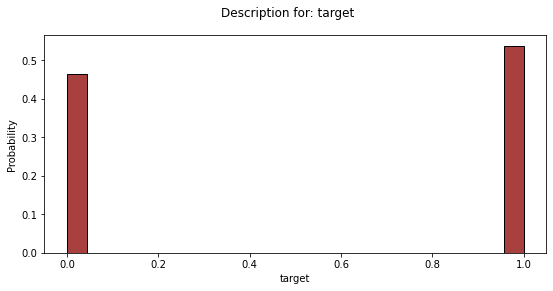

In [14]:
#Defines the structure od the plot
fig, axes = plt.subplots(figsize=(9, 4))
fig.suptitle('Description for: target')

#Histogram plot
#sns.distplot(
#    Xt_df['target'],
#    hist=True, 
#    bins=2, 
#    color = 'darkred', 
#    hist_kws={'edgecolor':'black'},
#    kde_kws={'linewidth': 4},
#    label='Total'
#)

sns.histplot(
    Xt_df['target'],
    stat = 'probability',
    color = 'darkred',
    label='Total',
)

skew_ = Xt_df['target'].skew()
kurt_ = Xt_df['target'].kurt()

print ('Skewness: ', skew_)
print ('Kurtosis: ', kurt_)

# Observe the initial df status

In [15]:
Xt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90000 entries, 0 to 89999
Data columns (total 57 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   warranty                          35243 non-null  object 
 1   sub_status                        90000 non-null  object 
 2   condition                         90000 non-null  object 
 3   deal_ids                          90000 non-null  object 
 4   base_price                        90000 non-null  float64
 5   non_mercado_pago_payment_methods  90000 non-null  object 
 6   seller_id                         90000 non-null  int64  
 7   variations                        90000 non-null  object 
 8   site_id                           90000 non-null  object 
 9   listing_type_id                   90000 non-null  object 
 10  price                             90000 non-null  float64
 11  attributes                        90000 non-null  object 
 12  buyi

## Detects numerical and categorical variables

In [16]:
coltypes_df = Xt_df.dtypes.reset_index().copy()
coltypes_df.columns = ['variable','type']
coltypes_df['type'] = coltypes_df['type'].apply(lambda x: str(x))
coltypes_df

,variable,type
0,warranty,object
1,sub_status,object
2,condition,object
3,deal_ids,object
4,base_price,float64
5,non_mercado_pago_payment_methods,object
6,seller_id,int64
7,variations,object
8,site_id,object
9,listing_type_id,object


In [17]:
catvars_ls = coltypes_df[coltypes_df['type'].isin(['object'])]['variable'].tolist()
print(len(catvars_ls))
catvars_ls

41


['warranty',
 'sub_status',
 'condition',
 'deal_ids',
 'non_mercado_pago_payment_methods',
 'variations',
 'site_id',
 'listing_type_id',
 'attributes',
 'buying_mode',
 'tags',
 'listing_source',
 'parent_item_id',
 'coverage_areas',
 'category_id',
 'descriptions',
 'last_updated',
 'international_delivery_mode',
 'pictures',
 'id',
 'differential_pricing',
 'currency_id',
 'thumbnail',
 'title',
 'date_created',
 'secure_thumbnail',
 'status',
 'video_id',
 'subtitle',
 'permalink',
 'seller_address.country.name',
 'seller_address.country.id',
 'seller_address.state.name',
 'seller_address.state.id',
 'seller_address.city.name',
 'seller_address.city.id',
 'shipping.methods',
 'shipping.tags',
 'shipping.mode',
 'shipping.dimensions',
 'shipping.free_methods']

In [18]:
numvars_ls = coltypes_df[
    (coltypes_df['type'].str.contains('float'))
    | (coltypes_df['type'].str.contains('int'))
    ]['variable'].tolist()

print(len(numvars_ls))
numvars_ls

12


['base_price',
 'seller_id',
 'price',
 'official_store_id',
 'original_price',
 'stop_time',
 'catalog_product_id',
 'initial_quantity',
 'start_time',
 'sold_quantity',
 'available_quantity',
 'target']

In [78]:
boolvars_ls = coltypes_df[coltypes_df['type'].isin(['bool'])]['variable'].tolist()
print(len(boolvars_ls))
boolvars_ls

4


['accepts_mercadopago',
 'automatic_relist',
 'shipping.local_pick_up',
 'shipping.free_shipping']

## Detects missing values

In [19]:
#Table of missing values

def missing_values_table(df):
    
    mis_val = df.isnull().sum()
    mis_val_percent = 100 * df.isnull().sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    
    mis_val_table_ren_columns = mis_val_table_ren_columns.reset_index().copy()
    mis_val_table_ren_columns = mis_val_table_ren_columns.rename(columns={'index':'variable'})
    
    return mis_val_table_ren_columns

missing_numvalues_df = missing_values_table(Xt_df)
missing_numvalues_df

,variable,Missing Values,% of Total Values
0,differential_pricing,90000,100.0
1,subtitle,90000,100.0
2,catalog_product_id,89993,100.0
3,shipping.dimensions,89978,100.0
4,original_price,89870,99.9
5,official_store_id,89255,99.2
6,video_id,87324,97.0
7,shipping.free_methods,87311,97.0
8,warranty,54757,60.8
9,parent_item_id,20690,23.0


In [20]:
#Table of missing values for categorical variables

def cat_missing_values_table(df):
    
    mis_val = df.isin(['nan','NaN','NAN','[]',[]]).sum()
    mis_val_percent = 100 * df.isin(['nan','NaN','NAN','[]',[]]).sum() / len(df)
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values'})
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)
    
    mis_val_table_ren_columns = mis_val_table_ren_columns.reset_index().copy()
    mis_val_table_ren_columns = mis_val_table_ren_columns.rename(columns={'index':'variable'})
    
    return mis_val_table_ren_columns

missing_catvalues_df = cat_missing_values_table(Xt_df)
missing_catvalues_df

,variable,Missing Values,% of Total Values
0,coverage_areas,90000,100.0
1,shipping.tags,89941,99.9
2,deal_ids,89783,99.8
3,sub_status,89109,99.0
4,shipping.methods,87310,97.0
5,variations,82626,91.8
6,attributes,78850,87.6
7,non_mercado_pago_payment_methods,27531,30.6
8,tags,22412,24.9
9,descriptions,2417,2.7


In [21]:
Xt_df.describe()

,base_price,seller_id,price,official_store_id,original_price,stop_time,catalog_product_id,initial_quantity,start_time,sold_quantity,available_quantity,target
count,9.000000e+04,9.000000e+04,9.000000e+04,745.000000,130.000000,9.000000e+04,7.000000e+00,90000.000000,9.000000e+04,90000.000000,90000.000000,90000.000000
mean,5.781341e+04,5.487386e+09,5.781352e+04,5802.018792,1492.522308,1.447648e+12,2.895700e+06,34.957178,1.442383e+12,2.328044,34.700767,0.537244
std,9.089555e+06,2.587140e+09,9.089555e+06,2657.056302,1954.905741,3.251040e+09,1.919771e+06,421.091981,2.122683e+09,33.839328,420.811703,0.498614
min,8.400000e-01,1.000319e+09,8.400000e-01,1024.000000,120.000000,1.444823e+12,9.440400e+04,1.000000,1.369110e+12,0.000000,1.000000,0.000000
25%,9.000000e+01,3.184875e+09,9.000000e+01,3590.000000,449.000000,1.446313e+12,1.925518e+06,1.000000,1.441144e+12,0.000000,1.000000,0.000000
50%,2.500000e+02,5.512496e+09,2.500000e+02,6158.000000,850.000000,1.447643e+12,3.051112e+06,1.000000,1.442524e+12,0.000000,1.000000,1.000000
75%,8.000000e+02,7.704930e+09,8.000000e+02,8216.000000,1500.000000,1.448930e+12,4.073615e+06,2.000000,1.443800e+12,0.000000,2.000000,1.000000
max,2.222222e+09,9.999853e+09,2.222222e+09,9996.000000,12248.000000,1.730732e+12,5.126117e+06,9999.000000,1.444900e+12,6065.000000,9999.000000,1.000000


## Filters missing values

In [22]:
print(Xt_df.shape)

(90000, 57)


In [23]:
Xt_1_df = Xt_df[
    (Xt_df['non_mercado_pago_payment_methods'].isin(['nan','NaN','NAN','[]',[]])==False)
]

print(Xt_1_df.shape)

(62469, 57)


In [24]:
missing_catvalues_df = cat_missing_values_table(Xt_1_df)
missing_catvalues_df

,variable,Missing Values,% of Total Values
0,coverage_areas,62469,100.0
1,shipping.tags,62419,99.9
2,deal_ids,62358,99.8
3,sub_status,61849,99.0
4,shipping.methods,60563,96.9
5,variations,58022,92.9
6,attributes,56809,90.9
7,tags,11406,18.3
8,descriptions,1201,1.9
9,pictures,331,0.5


# DF adjusting

## Discharts variables with high % of missings values (30%)

In [25]:
discharted_vars1_ls = missing_numvalues_df[missing_numvalues_df['% of Total Values']>30]['variable'].tolist()
discharted_vars2_ls = missing_catvalues_df[missing_catvalues_df['% of Total Values']>30]['variable'].tolist()

discharted_vars_ls = discharted_vars1_ls + discharted_vars2_ls
discharted_vars_ls = np.unique(np.array(discharted_vars_ls)).tolist()
discharted_vars_ls

['attributes',
 'catalog_product_id',
 'coverage_areas',
 'deal_ids',
 'differential_pricing',
 'official_store_id',
 'original_price',
 'shipping.dimensions',
 'shipping.free_methods',
 'shipping.methods',
 'shipping.tags',
 'sub_status',
 'subtitle',
 'variations',
 'video_id',
 'warranty']

In [26]:
# Detects id variables

allvars_ls = Xt_df.columns.tolist()
idvars_ls = [x for x in allvars_ls if 'id' in x]
idvars_ls

['deal_ids',
 'seller_id',
 'site_id',
 'listing_type_id',
 'parent_item_id',
 'category_id',
 'id',
 'official_store_id',
 'currency_id',
 'video_id',
 'catalog_product_id',
 'seller_address.country.id',
 'seller_address.state.id',
 'seller_address.city.id']

In [27]:
Xt_df[idvars_ls]

,deal_ids,seller_id,site_id,listing_type_id,parent_item_id,category_id,id,official_store_id,currency_id,video_id,catalog_product_id,seller_address.country.id,seller_address.state.id,seller_address.city.id
0,[],8208882349,MLA,bronze,MLA6553902747,MLA126406,MLA4695330653,NaN,ARS,None,NaN,AR,AR-C,TUxBQlNBTjkwNTZa
1,[],8141699488,MLA,silver,MLA7727150374,MLA10267,MLA7160447179,NaN,ARS,None,NaN,AR,AR-C,
2,[],8386096505,MLA,bronze,MLA6561247998,MLA1227,MLA7367189936,NaN,ARS,None,NaN,AR,AR-C,TUxBQkJPRTQ0OTRa
3,[],5377752182,MLA,silver,None,MLA86345,MLA9191625553,NaN,ARS,None,NaN,AR,AR-C,TUxBQkZMTzg5MjFa
4,[],2938071313,MLA,bronze,MLA3133256685,MLA41287,MLA7787961817,NaN,ARS,None,NaN,AR,AR-B,TUxBQ1RSRTMxODE5NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,[],9451922715,MLA,bronze,MLA1130924824,MLA1227,MLA1315520302,NaN,ARS,None,NaN,AR,AR-C,
89996,[],4665194056,MLA,bronze,MLA1317691731,MLA45559,MLA6934377054,NaN,ARS,None,NaN,AR,AR-C,TUxBQk7a0TcwOTRa
89997,[],3046474001,MLA,bronze,MLA5098165723,MLA81061,MLA5644559490,NaN,ARS,None,NaN,AR,AR-B,TUxBQ0xBTWF0YW56
89998,[],2373910598,MLA,bronze,MLA3153148762,MLA48851,MLA3520244075,NaN,ARS,None,NaN,AR,AR-U,


## Finding and fixing outliers

### Numerical variables

In [28]:
df_input = Xt_df.copy()

def calculate_quantile(i,df2):
    median_var = df2[[i]].quantile(0.5)[0]
    Q1 = df2[[i]].quantile(0.25)[0]
    Q3 = df2[[i]].quantile(0.75)[0]
    IQR = Q3 - Q1
    min_var = df2[[i]].min()[0]
    max_var = df2[[i]].max()[0]
    min_IQR = Q1 - 1.5*IQR
    max_IQR = Q3 + 1.5*IQR
    
    return median_var, Q1, Q3, min_var, max_var, min_IQR, max_IQR

def calculate_interval(i,df2):
    mean_var = df2[[i]].mean()[0]
    std_var = df2[[i]].std()[0]

    return mean_var, std_var


#find and interpolate the outliers

for i in numvars_ls:
    print('\nAttribute-',i,':')
    median_var, Q1, Q3, min_var, max_var, min_IQR, max_IQR = calculate_quantile(i,df_input)
    mean_var, std_var = calculate_interval(i,df_input)
    
    if (max_IQR == min_IQR):
        max_IQR = mean_var + 3*std_var
        min_IQR = mean_var - 3*std_var
    
    print(f'min_IQR: {min_IQR}')
    print(f'max_IQR: {max_IQR}')
    print(f'median_var: {median_var}')
    print(f'mean_var: {mean_var}')
    print(f'std_var: {std_var}')
    
    if(min_var < min_IQR):
        print(f'WU -> Low outlier is found = {min_var}')
    if(max_var > max_IQR):
        print(f'WU -> High outlier is found = {max_var}')
        
    # Fixing outliers
    def fix_outliers(x, max_IQR=max_IQR, min_IQR=min_IQR):
            
        if (x > max_IQR):
            x = max_IQR
        if (x < min_IQR):
            x = min_IQR
        else:
            x=x
            
        return x

    df_input[i] = df_input[i].map(fix_outliers)
    
    # Inputting missing values
    mean_var =df_input[[i]].mean()[0]
    
    def fix_missings(x, mean_var=mean_var):
        if (x == np.nan) | (x == None):
            x = mean_var
        if not x==x:
            x = mean_var
        else:
            x=x
        return x
    
    df_input[i] = df_input[i].map(fix_missings)

    if(len(df_input[df_input[i].isnull()][i])==0):
        print('WU -> Outliers has been interpolated')
    else:
        print('WU -> MISSING VALUES OBSERVED')
        
    
    iqr_ls = [i, mean_var, min_IQR, max_IQR]
    iqr_df = pd.DataFrame([iqr_ls], columns=['variable', 'mean_var', 'min_IQR', 'max_IQR'])
    if i == numvars_ls[0]:
        iqr_2_df = iqr_df.copy()
    else:
        iqr_2_df = pd.concat([iqr_df,iqr_2_df], axis=0).copy()
        
 
Xt_2_df = df_input.copy()
print(Xt_2_df.shape)


Attribute- base_price :
min_IQR: -975.0
max_IQR: 1865.0
median_var: 250.0
mean_var: 57813.40818888889
std_var: 9089554.787954355
WU -> High outlier is found = 2222222222.0
WU -> Outliers has been interpolated

Attribute- seller_id :
min_IQR: -3595207957.0
max_IQR: 14485012299.0
median_var: 5512495978.5
mean_var: 5487385581.631078
std_var: 2587139971.316138
WU -> Outliers has been interpolated

Attribute- price :
min_IQR: -975.0
max_IQR: 1865.0
median_var: 250.0
mean_var: 57813.51813333333
std_var: 9089554.78728271
WU -> High outlier is found = 2222222222.0
WU -> Outliers has been interpolated

Attribute- official_store_id :
min_IQR: -3349.0
max_IQR: 15155.0
median_var: 6158.0
mean_var: 5802.018791946309
std_var: 2657.056302225219
WU -> Outliers has been interpolated

Attribute- original_price :
min_IQR: -1127.5
max_IQR: 3076.5
median_var: 850.0
mean_var: 1492.5223076923075
std_var: 1954.905741190702
WU -> High outlier is found = 12248.0
WU -> Outliers has been interpolated

Attribute-

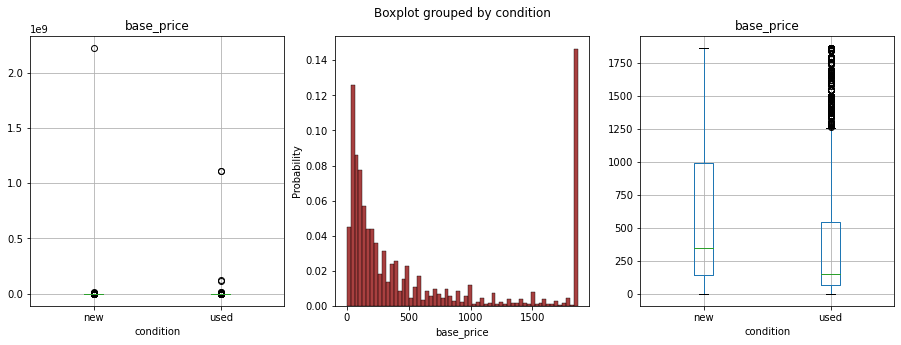

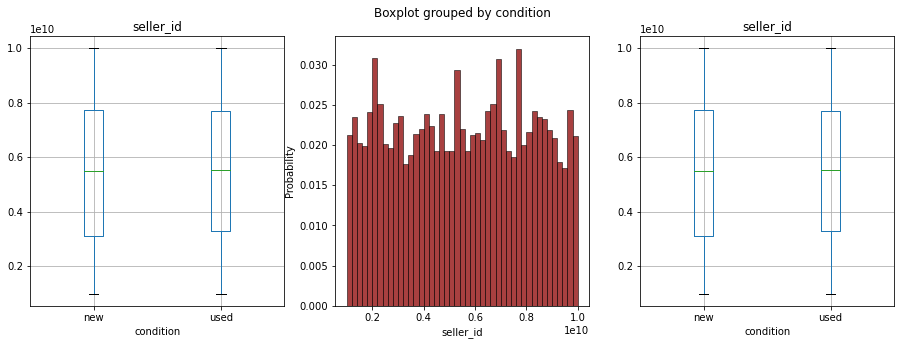

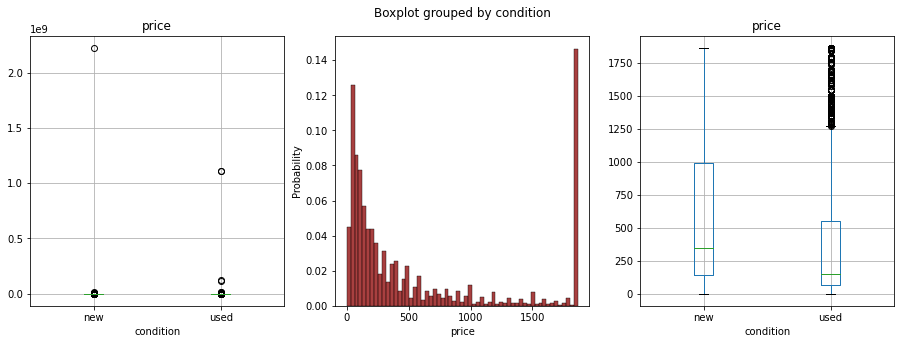

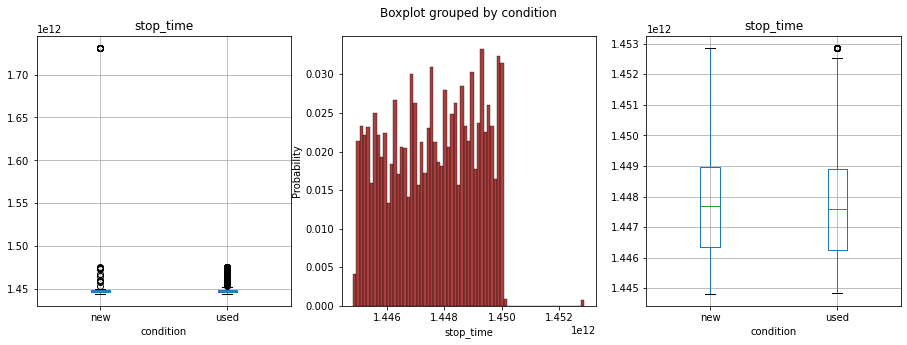

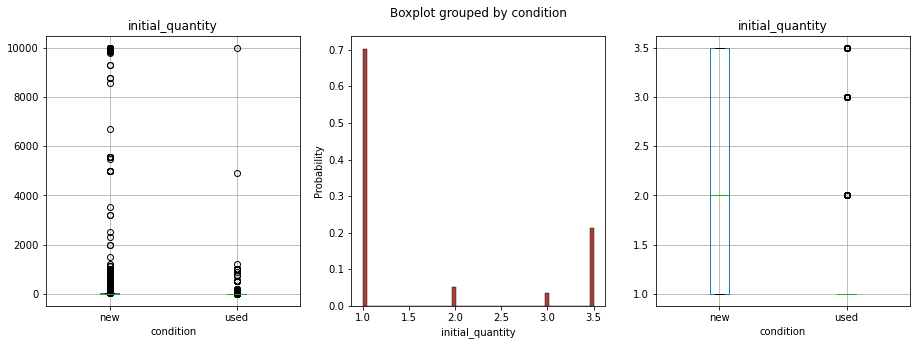

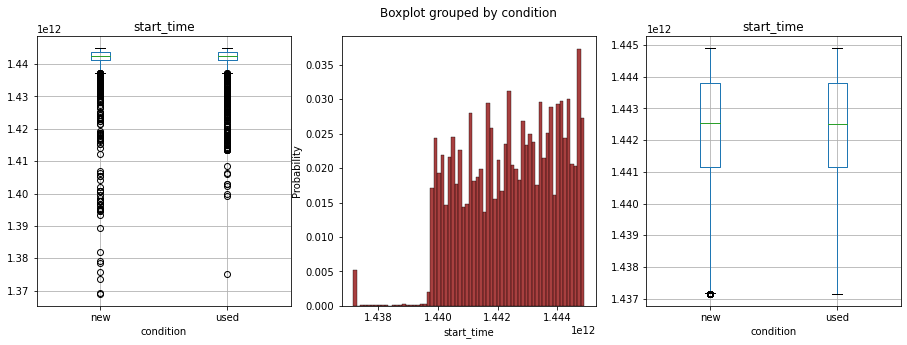

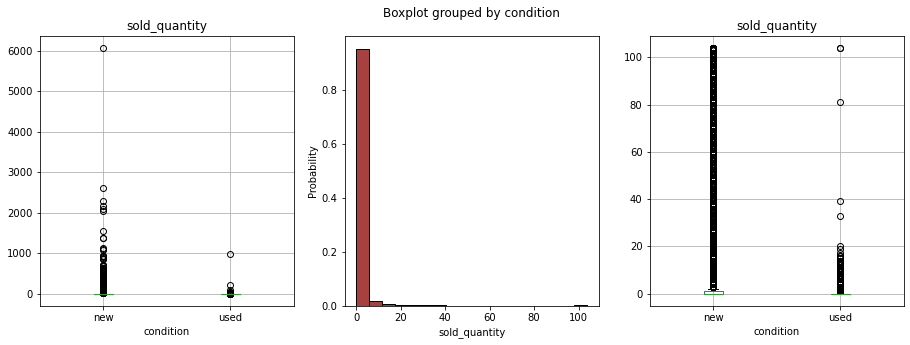

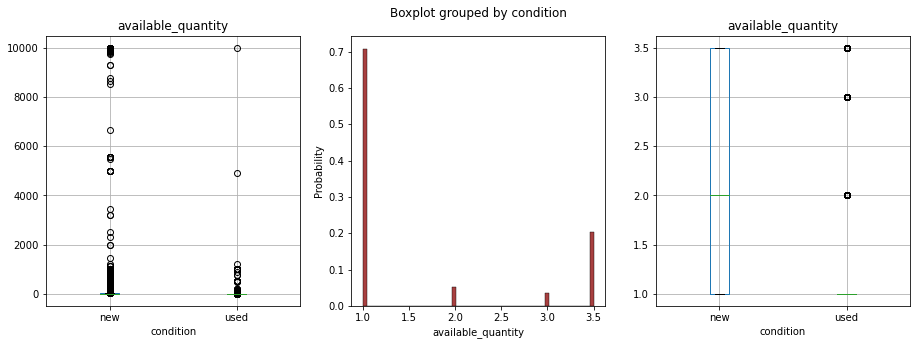

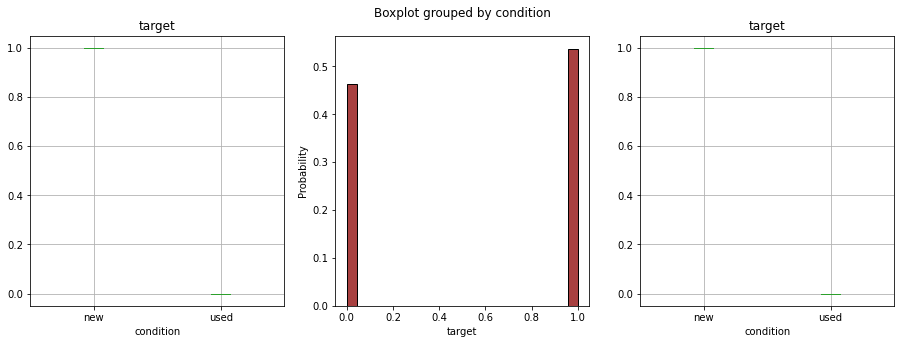

In [30]:
valid_vars_ls = numvars_ls
valid_vars_ls = [x for x in valid_vars_ls if x not in discharted_vars_ls]

for var in valid_vars_ls:
    
    fig, axes = plt.subplots(1,3,figsize=(15, 5))

    Xt_df.boxplot(column=var, by='condition',ax=axes[0])
    
    #Histogram plot
    sns.histplot(
        Xt_2_df[var],
        stat = 'probability',
        color = 'darkred',
        label='Total',
        ax=axes[1]
    )

    Xt_2_df.boxplot(column=var, by='condition',ax=axes[2])

In [32]:
selected_numvars_ls = [
    'base_price',
    'price',
    'stop_time',
    'initial_quantity',
    'start_time',
    'sold_quantity',
    'available_quantity',
]

selected_numvars_ls

['base_price',
 'price',
 'stop_time',
 'initial_quantity',
 'start_time',
 'sold_quantity',
 'available_quantity']

### Categorical variables

In [33]:
catvars_ls

['warranty',
 'sub_status',
 'condition',
 'deal_ids',
 'non_mercado_pago_payment_methods',
 'variations',
 'site_id',
 'listing_type_id',
 'attributes',
 'buying_mode',
 'tags',
 'listing_source',
 'parent_item_id',
 'coverage_areas',
 'category_id',
 'descriptions',
 'last_updated',
 'international_delivery_mode',
 'pictures',
 'id',
 'differential_pricing',
 'currency_id',
 'thumbnail',
 'title',
 'date_created',
 'secure_thumbnail',
 'status',
 'video_id',
 'subtitle',
 'permalink',
 'seller_address.country.name',
 'seller_address.country.id',
 'seller_address.state.name',
 'seller_address.state.id',
 'seller_address.city.name',
 'seller_address.city.id',
 'shipping.methods',
 'shipping.tags',
 'shipping.mode',
 'shipping.dimensions',
 'shipping.free_methods']

In [34]:
# Observes the categories by variable

for v in catvars_ls:
    input_df = Xt_df[[v]]
    input_df[v] = input_df[v].apply(lambda x: str(x).strip())
    obs_df = input_df.value_counts(v, dropna=False).reset_index()
    init_cats = len(obs_df)
    total_regs = len(input_df)
    pp_cats = init_cats/total_regs
    data = [v,init_cats,pp_cats]
    data_df = pd.DataFrame([data],columns=['variable','initial_categories','pp_categorical_values'])
    if v == catvars_ls[0]:
        output_df = data_df.copy()
    else:
        output_df = pd.concat([output_df,data_df],axis=0).copy()

catvar_categories_df = output_df.sort_values(['initial_categories'])
catvar_categories_df


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

,variable,initial_categories,pp_categorical_values
0,differential_pricing,1,0.000011
0,site_id,1,0.000011
0,subtitle,1,0.000011
0,listing_source,1,0.000011
0,coverage_areas,1,0.000011
0,international_delivery_mode,1,0.000011
0,condition,2,0.000022
0,seller_address.country.id,2,0.000022
0,seller_address.country.name,2,0.000022
0,currency_id,2,0.000022


In [35]:

# defines variables with just one value
catvar_exclusion1_ls = [
    'differential_pricing',
    'site_id',
    'subtitle',
    'listing_source',
    'coverage_areas',
    'international_delivery_mode',
]

# defines id variables and variables with large amount of categories
catvar_exclusion2_ls = [
    'permalink',
    'id',
    'pictures',
    'thumbnail',
    'secure_thumbnail',
    'descriptions',
    'last_updated',
    'date_created',
    'parent_item_id',
    'category_id',
]

catvar_exclusion_ls = catvar_exclusion1_ls + catvar_exclusion2_ls
catvar_exclusion_ls

['differential_pricing',
 'site_id',
 'subtitle',
 'listing_source',
 'coverage_areas',
 'international_delivery_mode',
 'permalink',
 'id',
 'pictures',
 'thumbnail',
 'secure_thumbnail',
 'descriptions',
 'last_updated',
 'date_created',
 'parent_item_id',
 'category_id']

In [36]:
Xt_df[catvar_exclusion_ls]

,differential_pricing,site_id,subtitle,listing_source,coverage_areas,international_delivery_mode,permalink,id,pictures,thumbnail,secure_thumbnail,descriptions,last_updated,date_created,parent_item_id,category_id
0,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA4695330...,MLA4695330653,"[{'size': '500x375', 'secure_url': 'https://a2...",http://mla-s1-p.mlstatic.com/5386-MLA469533065...,https://a248.e.akamai.net/mla-s1-p.mlstatic.co...,[{'id': 'MLA4695330653-912855983'}],2015-09-05T20:42:58.000Z,2015-09-05T20:42:53.000Z,MLA6553902747,MLA126406
1,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA7160447...,MLA7160447179,"[{'size': '499x334', 'secure_url': 'https://a2...",http://mla-s1-p.mlstatic.com/23223-MLA71604471...,https://a248.e.akamai.net/mla-s1-p.mlstatic.co...,[{'id': 'MLA7160447179-930764806'}],2015-09-26T18:08:34.000Z,2015-09-26T18:08:30.000Z,MLA7727150374,MLA10267
2,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA7367189...,MLA7367189936,"[{'size': '375x500', 'secure_url': 'https://a2...",http://mla-s1-p.mlstatic.com/22076-MLA73671899...,https://a248.e.akamai.net/mla-s1-p.mlstatic.co...,[{'id': 'MLA7367189936-916478256'}],2015-09-09T23:57:10.000Z,2015-09-09T23:57:07.000Z,MLA6561247998,MLA1227
3,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA9191625...,MLA9191625553,"[{'size': '441x423', 'secure_url': 'https://a2...",http://mla-s2-p.mlstatic.com/183901-MLA9191625...,https://a248.e.akamai.net/mla-s2-p.mlstatic.co...,[{'id': 'MLA9191625553-932309698'}],2015-10-05T16:03:50.306Z,2015-09-28T18:47:56.000Z,None,MLA86345
4,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA7787961...,MLA7787961817,"[{'size': '375x500', 'secure_url': 'https://a2...",http://mla-s2-p.mlstatic.com/13595-MLA77879618...,https://a248.e.akamai.net/mla-s2-p.mlstatic.co...,[{'id': 'MLA7787961817-902981678'}],2015-08-28T13:37:41.000Z,2015-08-24T22:07:20.000Z,MLA3133256685,MLA41287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA1315520...,MLA1315520302,"[{'size': '84x126', 'secure_url': 'https://a24...",http://mla-s2-p.mlstatic.com/13612-MLA13155203...,https://a248.e.akamai.net/mla-s2-p.mlstatic.co...,[{'id': 'MLA1315520302-935540165'}],2015-10-02T13:36:51.000Z,2015-10-02T13:36:50.000Z,MLA1130924824,MLA1227
89996,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA6934377...,MLA6934377054,"[{'size': '500x373', 'secure_url': 'https://a2...",http://mla-s1-p.mlstatic.com/15240-MLA69343770...,https://a248.e.akamai.net/mla-s1-p.mlstatic.co...,[{'id': 'MLA6934377054-927516382'}],2015-10-05T17:45:04.000Z,2015-09-22T23:30:21.000Z,MLA1317691731,MLA45559
89997,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA5644559...,MLA5644559490,"[{'size': '500x312', 'secure_url': 'https://a2...",http://mla-s1-p.mlstatic.com/600001-MLA5644559...,https://a248.e.akamai.net/mla-s1-p.mlstatic.co...,[{'id': 'MLA5644559490-902956215'}],2015-08-24T21:33:54.000Z,2015-08-24T21:33:51.000Z,MLA5098165723,MLA81061
89998,None,MLA,None,,[],none,http://articulo.mercadolibre.com.ar/MLA3520244...,MLA3520244075,"[{'size': '225x225', 'secure_url': 'https://a2...",http://mla-s2-p.mlstatic.com/4664-MLA352024407...,https://a248.e.akamai.net/mla-s2-p.mlstatic.co...,[{'id': 'MLA3520244075-935837959'}],2015-10-02T19:21:05.000Z,2015-10-02T19:20:56.000Z,MLA3153148762,MLA48851


In [38]:
v = 'title'

obs_df = Xt_df[[v,'target']]

obs_df[v+'_2'] = obs_df[v].apply(lambda x: 'USADO' if 'USADO' in str(x).upper() else 'NA')

obs_df.groupby(
    [v+'_2'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    pp_target = ('target','mean'),
)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,title_2,regs,pp_target
0,NA,89484,0.540219
1,USADO,516,0.021318


In [41]:
#Filters valid categoricals

catvars_filtered_ls = [x for x in catvars_ls if x not in catvar_exclusion_ls]
catvars_filtered_ls

['warranty',
 'sub_status',
 'condition',
 'deal_ids',
 'non_mercado_pago_payment_methods',
 'variations',
 'listing_type_id',
 'attributes',
 'buying_mode',
 'tags',
 'currency_id',
 'title',
 'status',
 'video_id',
 'seller_address.country.name',
 'seller_address.country.id',
 'seller_address.state.name',
 'seller_address.state.id',
 'seller_address.city.name',
 'seller_address.city.id',
 'shipping.methods',
 'shipping.tags',
 'shipping.mode',
 'shipping.dimensions',
 'shipping.free_methods']

In [42]:
catvar_filtered_df = catvar_categories_df[
    catvar_categories_df['variable'].isin(catvars_filtered_ls)
]

catvar_filtered_df

,variable,initial_categories,pp_categorical_values
0,condition,2,0.000022
0,seller_address.country.id,2,0.000022
0,seller_address.country.name,2,0.000022
0,currency_id,2,0.000022
0,shipping.tags,3,0.000033
0,shipping.methods,3,0.000033
0,buying_mode,3,0.000033
0,sub_status,4,0.000044
0,shipping.mode,4,0.000044
0,status,4,0.000044


In [43]:
# Choose variables with large amount fo categories

catvar_targetenc_ls = catvar_filtered_df[catvar_filtered_df['initial_categories']>500]['variable'].tolist()
catvar_targetenc_ls

['video_id',
 'attributes',
 'seller_address.city.name',
 'variations',
 'warranty',
 'title']

In [44]:
v = 'video_id'

input_df = Xt_df[[v]].copy()
input_df[v] = input_df[v].apply(lambda x: str(x).strip())
obs_df = input_df.value_counts(v, dropna=False).reset_index()
obs_df

,video_id,0
0,None,87324
1,QQNfOicE_o8,278
2,EVCQuwl7RIE,82
3,mYNRC5Ia1sk,35
4,U7okRYLuBNo,25
...,...,...
1882,M8_cAwkVLfQ,1
1883,M6WR3_zl2hk,1
1884,M46GOGaMo5k,1
1885,M1H7ulJgTAw,1


In [45]:
#Filters short categoricals

catvars_filtered2_ls = [x for x in catvars_filtered_ls if x not in catvar_targetenc_ls]
catvars_filtered2_ls

['sub_status',
 'condition',
 'deal_ids',
 'non_mercado_pago_payment_methods',
 'listing_type_id',
 'buying_mode',
 'tags',
 'currency_id',
 'status',
 'seller_address.country.name',
 'seller_address.country.id',
 'seller_address.state.name',
 'seller_address.state.id',
 'seller_address.city.id',
 'shipping.methods',
 'shipping.tags',
 'shipping.mode',
 'shipping.dimensions',
 'shipping.free_methods']

In [46]:
catvar_filtered_df = catvar_categories_df[
    catvar_categories_df['variable'].isin(catvars_filtered2_ls)
]

catvar_filtered_df

,variable,initial_categories,pp_categorical_values
0,condition,2,0.000022
0,seller_address.country.id,2,0.000022
0,seller_address.country.name,2,0.000022
0,currency_id,2,0.000022
0,shipping.tags,3,0.000033
0,shipping.methods,3,0.000033
0,buying_mode,3,0.000033
0,sub_status,4,0.000044
0,shipping.mode,4,0.000044
0,status,4,0.000044



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

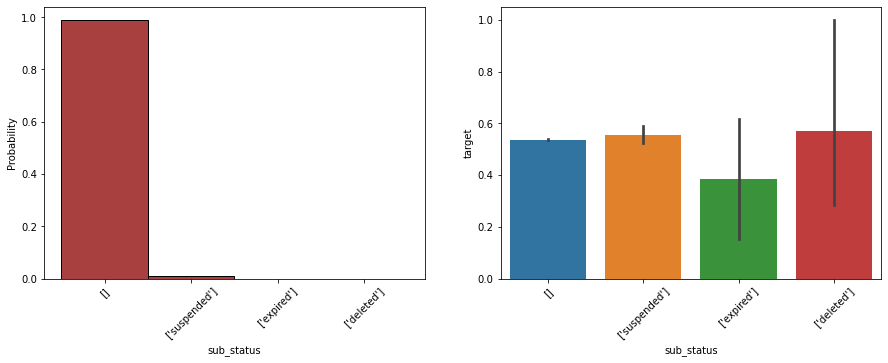

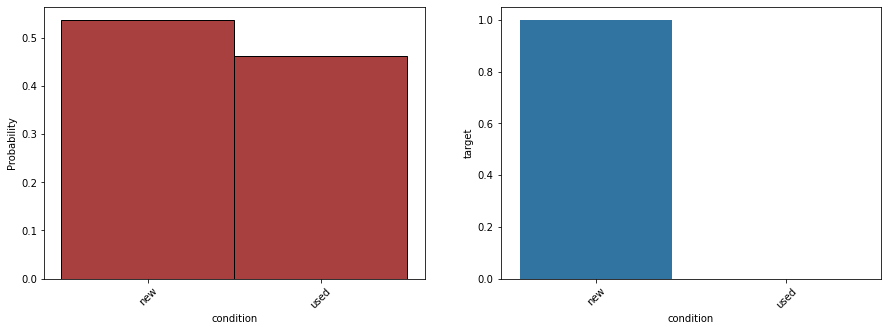

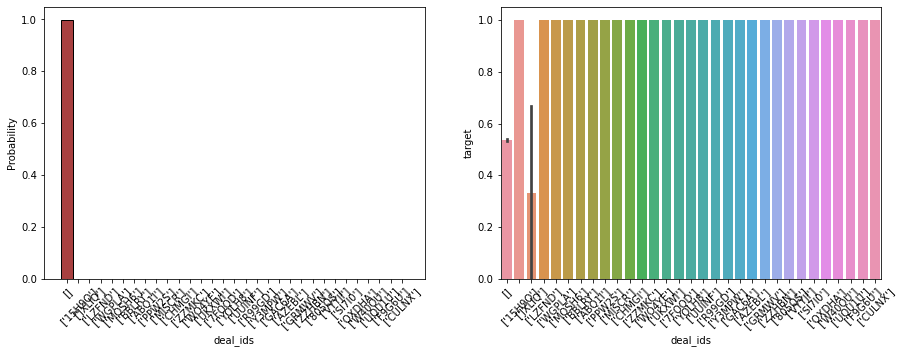

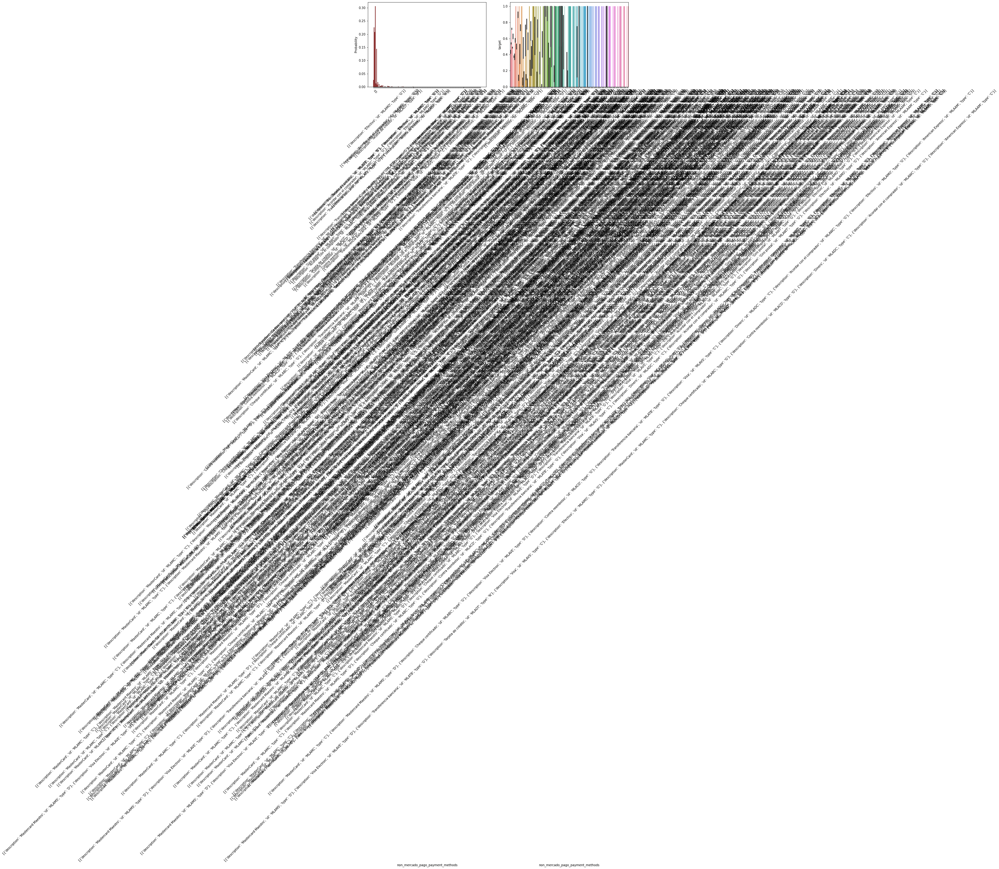

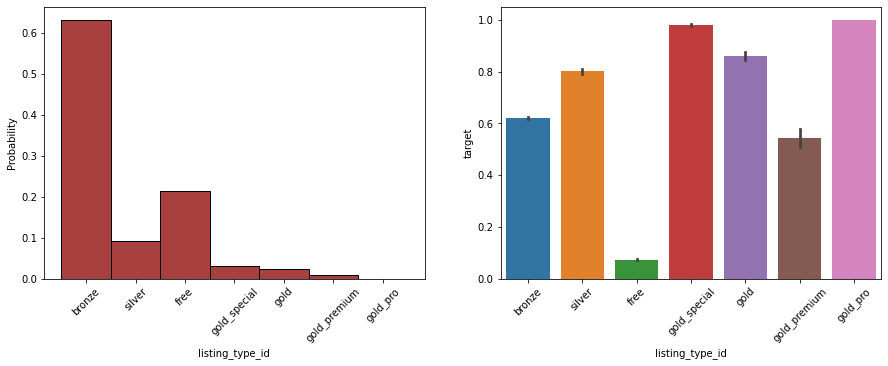

...

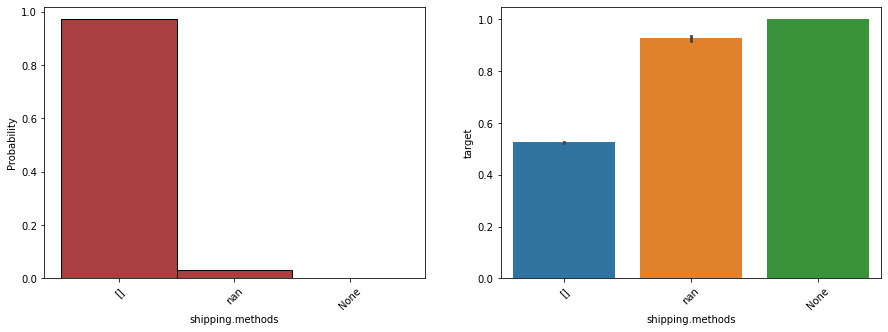

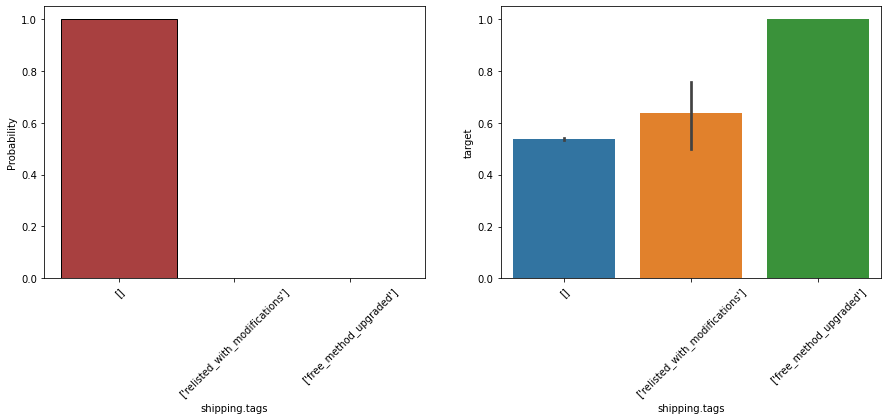

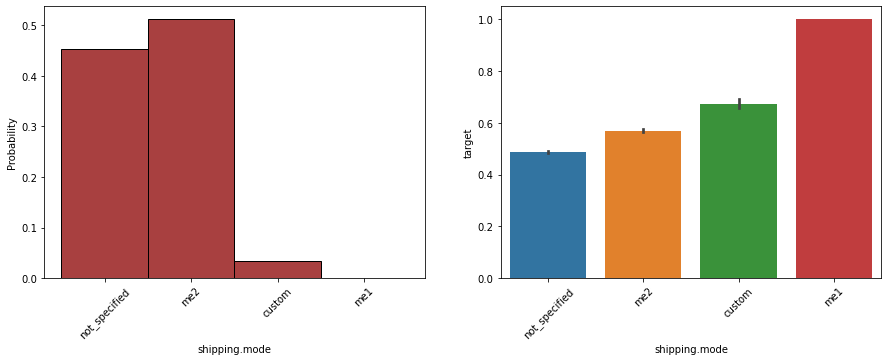

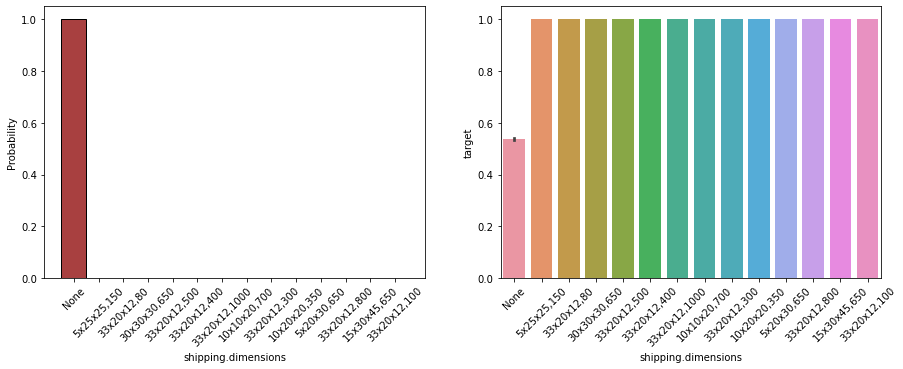

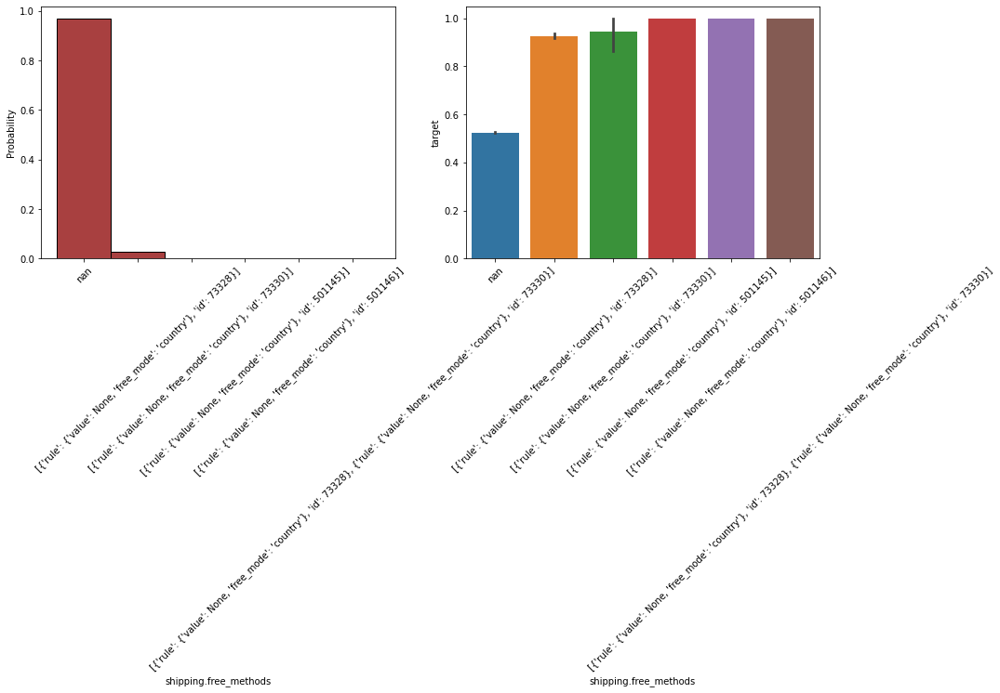

In [47]:
for v in catvars_filtered2_ls:

    var=v
    target = 'target'
    
    input_df = Xt_2_df[[var,target]]
    input_df[var] = input_df[var].apply(lambda x: str(x).strip())

    fig, axes = plt.subplots(1,2,figsize=(15, 5))
    fig = sns.barplot(x=var,y=target, data=input_df, ax=axes[1])
    
    sns.histplot(input_df[var],
                 stat = 'probability',
                 color = 'darkred',
                 label='Total',
                 ax=axes[0],
    )

    plt.sca(axes[0]) #set the graph
    plt.xticks(rotation=45)
    plt.sca(axes[1]) #set the graph
    plt.xticks(rotation=45)

# Compute new variables

## Manual trasnformation

In [48]:
def fix_dates_f(date):
    
    date = str(date)
    
    year = int(date[0:4])
    month = int(date[5:7])
    day = int(date[8:10])
    
    output = datetime.datetime(year,month,day).date()
    current_date = datetime.datetime.now().date()
    current_date = datetime.datetime(2015,10,15).date()
    diff_days = (current_date - output).days
    
    return output, diff_days


output_data = Xt_2_df['date_created'].apply(lambda x: fix_dates_f(x))
output_df = pd.DataFrame(output_data.tolist(),columns=['date_created','days_up_today'])
output_df

Xt_2_df['date_created'] = output_df['date_created']
Xt_2_df['days_up_today'] = output_df['days_up_today']

Xt_2_df

,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,seller_address.city.id,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods,target,days_up_today
0,None,[],new,[],80.00,"[{'description': 'Transferencia bancaria', 'id...",8208882349,[],MLA,bronze,...,TUxBQlNBTjkwNTZa,True,[],[],False,not_specified,None,NaN,1,40
1,NUESTRA REPUTACION,[],used,[],1865.00,"[{'description': 'Transferencia bancaria', 'id...",8141699488,[],MLA,silver,...,,True,[],[],False,me2,None,NaN,0,19
2,None,[],used,[],60.00,"[{'description': 'Transferencia bancaria', 'id...",8386096505,[],MLA,bronze,...,TUxBQkJPRTQ0OTRa,True,[],[],False,me2,None,NaN,0,36
3,None,[],new,[],580.00,"[{'description': 'Transferencia bancaria', 'id...",5377752182,[],MLA,silver,...,TUxBQkZMTzg5MjFa,True,[],[],False,me2,None,NaN,1,17
4,MI REPUTACION.,[],used,[],30.00,"[{'description': 'Transferencia bancaria', 'id...",2938071313,[],MLA,bronze,...,TUxBQ1RSRTMxODE5NA,True,[],[],False,not_specified,None,NaN,0,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,Sin garantía,[],used,[],68.00,[],9451922715,[],MLA,bronze,...,,False,[],[],False,me2,None,NaN,0,13
89996,None,[],new,[],126.00,"[{'description': 'Transferencia bancaria', 'id...",4665194056,[],MLA,bronze,...,TUxBQk7a0TcwOTRa,True,[],[],False,custom,None,NaN,1,23
89997,None,[],new,[],300.00,"[{'description': 'Efectivo', 'id': 'MLAMO', 't...",3046474001,[],MLA,bronze,...,TUxBQ0xBTWF0YW56,True,[],[],False,not_specified,None,NaN,1,52
89998,La garantia solo responde en caso de fallas de...,[],new,[],696.58,"[{'description': 'Acordar con el comprador', '...",2373910598,[],MLA,bronze,...,,False,[],[],False,not_specified,None,NaN,1,13


In [49]:
def mp_payment_methods_f(x):
    
    nro_payment_methods = 0
    
    if len(x)>0:
        nro_payment_methods = len(x)
    
    return nro_payment_methods

Xt_2_df['mp_nro_payment_methods'] = Xt_df['non_mercado_pago_payment_methods'].apply(lambda x: mp_payment_methods_f(x))
Xt_2_df

,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods,target,days_up_today,mp_nro_payment_methods
0,None,[],new,[],80.00,"[{'description': 'Transferencia bancaria', 'id...",8208882349,[],MLA,bronze,...,True,[],[],False,not_specified,None,NaN,1,40,3
1,NUESTRA REPUTACION,[],used,[],1865.00,"[{'description': 'Transferencia bancaria', 'id...",8141699488,[],MLA,silver,...,True,[],[],False,me2,None,NaN,0,19,2
2,None,[],used,[],60.00,"[{'description': 'Transferencia bancaria', 'id...",8386096505,[],MLA,bronze,...,True,[],[],False,me2,None,NaN,0,36,3
3,None,[],new,[],580.00,"[{'description': 'Transferencia bancaria', 'id...",5377752182,[],MLA,silver,...,True,[],[],False,me2,None,NaN,1,17,3
4,MI REPUTACION.,[],used,[],30.00,"[{'description': 'Transferencia bancaria', 'id...",2938071313,[],MLA,bronze,...,True,[],[],False,not_specified,None,NaN,0,52,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,Sin garantía,[],used,[],68.00,[],9451922715,[],MLA,bronze,...,False,[],[],False,me2,None,NaN,0,13,0
89996,None,[],new,[],126.00,"[{'description': 'Transferencia bancaria', 'id...",4665194056,[],MLA,bronze,...,True,[],[],False,custom,None,NaN,1,23,2
89997,None,[],new,[],300.00,"[{'description': 'Efectivo', 'id': 'MLAMO', 't...",3046474001,[],MLA,bronze,...,True,[],[],False,not_specified,None,NaN,1,52,1
89998,La garantia solo responde en caso de fallas de...,[],new,[],696.58,"[{'description': 'Acordar con el comprador', '...",2373910598,[],MLA,bronze,...,False,[],[],False,not_specified,None,NaN,1,13,1


In [50]:
def payment_method_tb_f(x):
    
    payment_method_tb = 0
    payment_method_tc = 0
    payment_method_ef = 0
    payment_method_acuerdo = 0
    payment_method_giro = 0
    payment_method_mp = 0
    
    if len(x)>0:
        for i in range(0,len(x)):
            if 'TRANSFE' in str(x[i]).upper():
                payment_method_tb = 1
                
            if 'MASTER' in str(x[i]).upper():
                payment_method_tc = 1
            if 'VISA' in str(x[i]).upper():
                payment_method_tc = 1
                
            if 'EFECT' in str(x[i]).upper():
                payment_method_ef = 1
                
            if 'ACORDAR' in str(x[i]).upper():
                payment_method_acuerdo = 1
            
            if 'GIRO' in str(x[i]).upper():
                payment_method_giro = 1
                
            if 'MERCADO' in str(x[i]).upper():
                payment_method_mp = 1
            
    return payment_method_tb, payment_method_tc, payment_method_ef, payment_method_acuerdo, payment_method_giro, payment_method_mp

outputs_data = Xt_df['non_mercado_pago_payment_methods'].apply(lambda x: payment_method_tb_f(x))
cols_ls = [
    'payment_method_tb', 
    'payment_method_tc', 
    'payment_method_ef',
    'payment_method_acuerdo',
    'payment_method_giro',
    'payment_method_mp',
]

outputs_df = pd.DataFrame(outputs_data.tolist(), columns=cols_ls)
Xt_2_df[cols_ls] = outputs_df[cols_ls]

for v in cols_ls:
    print(Xt_2_df.value_counts(v))


Xt_2_df

payment_method_tb
1    46300
0    43700
dtype: int64
payment_method_tc
0    89367
1      633
dtype: int64
payment_method_ef
1    60350
0    29650
dtype: int64
payment_method_acuerdo
0    82825
1     7175
dtype: int64
payment_method_giro
0    88511
1     1489
dtype: int64
payment_method_mp
0    89354
1      646
dtype: int64


,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,shipping.free_methods,target,days_up_today,mp_nro_payment_methods,payment_method_tb,payment_method_tc,payment_method_ef,payment_method_acuerdo,payment_method_giro,payment_method_mp
0,None,[],new,[],80.00,"[{'description': 'Transferencia bancaria', 'id...",8208882349,[],MLA,bronze,...,NaN,1,40,3,1,0,1,1,0,0
1,NUESTRA REPUTACION,[],used,[],1865.00,"[{'description': 'Transferencia bancaria', 'id...",8141699488,[],MLA,silver,...,NaN,0,19,2,1,0,1,0,0,0
2,None,[],used,[],60.00,"[{'description': 'Transferencia bancaria', 'id...",8386096505,[],MLA,bronze,...,NaN,0,36,3,1,0,1,0,0,0
3,None,[],new,[],580.00,"[{'description': 'Transferencia bancaria', 'id...",5377752182,[],MLA,silver,...,NaN,1,17,3,1,0,1,0,0,0
4,MI REPUTACION.,[],used,[],30.00,"[{'description': 'Transferencia bancaria', 'id...",2938071313,[],MLA,bronze,...,NaN,0,52,3,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,Sin garantía,[],used,[],68.00,[],9451922715,[],MLA,bronze,...,NaN,0,13,0,0,0,0,0,0,0
89996,None,[],new,[],126.00,"[{'description': 'Transferencia bancaria', 'id...",4665194056,[],MLA,bronze,...,NaN,1,23,2,1,0,1,0,0,0
89997,None,[],new,[],300.00,"[{'description': 'Efectivo', 'id': 'MLAMO', 't...",3046474001,[],MLA,bronze,...,NaN,1,52,1,0,0,1,0,0,0
89998,La garantia solo responde en caso de fallas de...,[],new,[],696.58,"[{'description': 'Acordar con el comprador', '...",2373910598,[],MLA,bronze,...,NaN,1,13,1,0,0,0,1,0,0


In [52]:
def title2_f(x):
    
    output = 'NA'
    
    if 'NUEVO' in str(x).strip().upper():
        output = 'NUEVO'
        
    if 'SELLADO' in str(x).strip().upper():
        output = 'NUEVO'
    
    if 'USADO' in str(x).strip().upper():
        output = 'USADO'
    
    if 'REPAR' in str(x).strip().upper():
        output = 'USADO'
        
    if 'DAÑ' in str(x).strip().upper():
        output = 'DANADO'
    
    return output

Xt_2_df['title2'] = Xt_df['title'].apply(lambda x: title2_f(x))

obs_df = Xt_2_df.groupby(
    ['title2'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    pp_target = ('target','mean'),
)

obs_df

,title2,regs,pp_target
0,DANADO,24,0.458333
1,NA,85958,0.528607
2,NUEVO,3301,0.848834
3,USADO,717,0.140865


In [53]:
Xt_df[['title','condition']]

,title,condition
0,Auriculares Samsung Originales Manos Libres Ca...,new
1,Cuchillo Daga Acero Carbón Casco Yelmo Solinge...,used
2,"Antigua Revista Billiken, N° 1826, Año 1954",used
3,Alarma Guardtex Gx412 Seguridad Para El Automo...,new
4,Serenata - Jennifer Blake,used
...,...,...
89995,El Fin De Las Libertades - Benegas Lynch (h) -...,used
89996,Honda Wave Guardabarro Interior Trasero,new
89997,My Little Pony Completa Latino 4 Temporadas,new
89998,Accidente Cerebrovascular En La Infancia Y Ado...,new


In [54]:
def warranty2_f(x):
    
    output = 'NA'
    
    if 'USADO' in str(x).strip().upper():
        output = 'USADO'
    
    if 'NUEVO' in str(x).strip().upper():
        output = 'NUEVO'
    
    if 'SELLADO' in str(x).strip().upper():
        output = 'NUEVO'
    
    return output

Xt_2_df['warranty2'] = Xt_df['warranty'].apply(lambda x: warranty2_f(x))

obs_df = Xt_2_df.groupby(
    ['warranty2'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    pp_target = ('target','mean'),
)

obs_df

,warranty2,regs,pp_target
0,NA,88829,0.533125
1,NUEVO,999,0.927928
2,USADO,172,0.395349


In [79]:
Xt_df[boolvars_ls]

,accepts_mercadopago,automatic_relist,shipping.local_pick_up,shipping.free_shipping
0,True,False,True,False
1,True,False,True,False
2,True,False,True,False
3,True,False,True,False
4,True,False,True,False
...,...,...,...,...
89995,True,False,False,False
89996,True,False,True,False
89997,True,False,True,False
89998,True,False,False,False


In [83]:
def fix_boolean(x):
    output = 0
    if str(x)=='True':
        output = 1
    return output

for v in boolvars_ls:
    Xt_2_df[v] = Xt_df[v].apply(lambda x: fix_boolean(x))
    print(Xt_2_df.value_counts(v))

Xt_2_df[boolvars_ls]

accepts_mercadopago
1    88018
0     1982
dtype: int64
automatic_relist
0    85773
1     4227
dtype: int64
shipping.local_pick_up
1    71577
0    18423
dtype: int64
shipping.free_shipping
0    87303
1     2697
dtype: int64


,accepts_mercadopago,automatic_relist,shipping.local_pick_up,shipping.free_shipping
0,1,0,1,0
1,1,0,1,0
2,1,0,1,0
3,1,0,1,0
4,1,0,1,0
...,...,...,...,...
89995,1,0,0,0
89996,1,0,1,0
89997,1,0,1,0
89998,1,0,0,0


## Target Encoder for large categorical variables

In [55]:
def fix_category(x):
    output = str(x).strip()
    if output in [None,'None','','nan','NAN','NaN',[],'[]']:
        output = 'NA'
    return output


for v in catvar_targetenc_ls:
    Xt_2_df[v] = Xt_2_df[v].apply(lambda x: fix_category(x))
    
Xt_2_df[catvar_targetenc_ls]

,video_id,attributes,seller_address.city.name,variations,warranty,title
0,NA,NA,San Cristóbal,NA,NA,Auriculares Samsung Originales Manos Libres Ca...
1,NA,NA,Buenos Aires,NA,NUESTRA REPUTACION,Cuchillo Daga Acero Carbón Casco Yelmo Solinge...
2,NA,NA,Boedo,NA,NA,"Antigua Revista Billiken, N° 1826, Año 1954"
3,NA,NA,Floresta,NA,NA,Alarma Guardtex Gx412 Seguridad Para El Automo...
4,NA,NA,Tres de febrero,NA,MI REPUTACION.,Serenata - Jennifer Blake
...,...,...,...,...,...,...
89995,NA,NA,capital federal,NA,Sin garantía,El Fin De Las Libertades - Benegas Lynch (h) -...
89996,NA,NA,Núñez,NA,NA,Honda Wave Guardabarro Interior Trasero
89997,NA,NA,La Matanza,NA,NA,My Little Pony Completa Latino 4 Temporadas
89998,NA,NA,Trelew,NA,La garantia solo responde en caso de fallas de...,Accidente Cerebrovascular En La Infancia Y Ado...


In [56]:
target_enc = ce.TargetEncoder()

# Defines the column transformer
tet = ColumnTransformer([("te1", target_enc, catvar_targetenc_ls)])

y = Xt_df['target']
catvar_targetenc_df = tet.fit_transform(Xt_2_df, y)
catvar_targetenc_df = pd.DataFrame(catvar_targetenc_df, columns=catvar_targetenc_ls)
catvar_targetenc_df

Default parameter min_samples_leaf will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327
Default parameter smoothing will change in version 2.6.See https://github.com/scikit-learn-contrib/category_encoders/issues/327


,video_id,attributes,seller_address.city.name,variations,warranty,title
0,0.53006,0.528535,0.666667,0.533876,0.483317,0.537244
1,0.53006,0.528535,0.472616,0.533876,0.800000,0.537244
2,0.53006,0.528535,0.508361,0.533876,0.483317,0.537244
3,0.53006,0.528535,0.543011,0.533876,0.483317,0.537244
4,0.53006,0.528535,0.320930,0.533876,0.095238,0.537244
...,...,...,...,...,...,...
89995,0.53006,0.528535,0.562018,0.533876,0.344406,0.537244
89996,0.53006,0.528535,0.347458,0.533876,0.483317,0.537244
89997,0.53006,0.528535,0.576642,0.533876,0.483317,0.537244
89998,0.53006,0.528535,0.863636,0.533876,1.000000,0.537244


In [57]:
Xt_2_df[catvar_targetenc_ls] = catvar_targetenc_df[catvar_targetenc_ls]
Xt_2_df[catvar_targetenc_ls]

,video_id,attributes,seller_address.city.name,variations,warranty,title
0,0.53006,0.528535,0.666667,0.533876,0.483317,0.537244
1,0.53006,0.528535,0.472616,0.533876,0.800000,0.537244
2,0.53006,0.528535,0.508361,0.533876,0.483317,0.537244
3,0.53006,0.528535,0.543011,0.533876,0.483317,0.537244
4,0.53006,0.528535,0.320930,0.533876,0.095238,0.537244
...,...,...,...,...,...,...
89995,0.53006,0.528535,0.562018,0.533876,0.344406,0.537244
89996,0.53006,0.528535,0.347458,0.533876,0.483317,0.537244
89997,0.53006,0.528535,0.576642,0.533876,0.483317,0.537244
89998,0.53006,0.528535,0.863636,0.533876,1.000000,0.537244


## One Hot Encoding

In [58]:
catvars_filtered21_ls = catvars_filtered2_ls + ['title2','warranty2']
catvars_filtered21_ls

['sub_status',
 'condition',
 'deal_ids',
 'non_mercado_pago_payment_methods',
 'listing_type_id',
 'buying_mode',
 'tags',
 'currency_id',
 'status',
 'seller_address.country.name',
 'seller_address.country.id',
 'seller_address.state.name',
 'seller_address.state.id',
 'seller_address.city.id',
 'shipping.methods',
 'shipping.tags',
 'shipping.mode',
 'shipping.dimensions',
 'shipping.free_methods',
 'title2',
 'warranty2']

In [59]:
new_catvar_exclude_ls = [
    'condition',
    'seller_address.state.id',
    'seller_address.country.id',
]

catvars_filtered3_ls = [x for x in catvars_filtered21_ls if x not in new_catvar_exclude_ls]
catvars_filtered3_ls

['sub_status',
 'deal_ids',
 'non_mercado_pago_payment_methods',
 'listing_type_id',
 'buying_mode',
 'tags',
 'currency_id',
 'status',
 'seller_address.country.name',
 'seller_address.state.name',
 'seller_address.city.id',
 'shipping.methods',
 'shipping.tags',
 'shipping.mode',
 'shipping.dimensions',
 'shipping.free_methods',
 'title2',
 'warranty2']

In [60]:
def fix_category(x):
    output = str(x).strip()
    if output in [None,'None','','nan','NAN','NaN']:
        output = 'NA'
    if output in [[],'[]']:
        output = 'NA2'
    return output


for v in catvars_filtered3_ls:
    Xt_2_df[v] = Xt_2_df[v].apply(lambda x: fix_category(x))
    
Xt_2_df[catvars_filtered3_ls]

,sub_status,deal_ids,non_mercado_pago_payment_methods,listing_type_id,buying_mode,tags,currency_id,status,seller_address.country.name,seller_address.state.name,seller_address.city.id,shipping.methods,shipping.tags,shipping.mode,shipping.dimensions,shipping.free_methods,title2,warranty2
0,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Capital Federal,TUxBQlNBTjkwNTZa,NA2,NA2,not_specified,NA,NA,NA,NA
1,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",silver,buy_it_now,NA2,ARS,active,Argentina,Capital Federal,NA,NA2,NA2,me2,NA,NA,NA,NA
2,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Capital Federal,TUxBQkJPRTQ0OTRa,NA2,NA2,me2,NA,NA,NA,NA
3,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",silver,buy_it_now,NA2,ARS,active,Argentina,Capital Federal,TUxBQkZMTzg5MjFa,NA2,NA2,me2,NA,NA,NA,NA
4,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Buenos Aires,TUxBQ1RSRTMxODE5NA,NA2,NA2,not_specified,NA,NA,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,NA2,NA2,NA2,bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Capital Federal,NA,NA2,NA2,me2,NA,NA,USADO,NA
89996,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,paused,Argentina,Capital Federal,TUxBQk7a0TcwOTRa,NA2,NA2,custom,NA,NA,NA,NA
89997,NA2,NA2,"[{'description': 'Efectivo', 'id': 'MLAMO', 't...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Buenos Aires,TUxBQ0xBTWF0YW56,NA2,NA2,not_specified,NA,NA,NA,NA
89998,NA2,NA2,"[{'description': 'Acordar con el comprador', '...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Chubut,NA,NA2,NA2,not_specified,NA,NA,NA,NA


In [61]:
onehot_enc = OneHotEncoder(sparse=False, handle_unknown='ignore', drop='if_binary')

# Defines the column transformer
oht = ColumnTransformer([("oh1", onehot_enc, catvars_filtered3_ls)])

catvar_onehotenc_df = oht.fit_transform(Xt_2_df)
catvar_onehotenc_df

array([[1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       ...,
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.]])

In [62]:
catvar_onehotenc_df.shape

(90000, 578)

In [63]:
catvar_onehotenc_ls = oht.get_feature_names_out()
catvar_onehotenc_ls = [x.replace('oh1__','') for x in catvar_onehotenc_ls]
catvar_onehotenc_ls

['sub_status_NA2',
 "sub_status_['deleted']",
 "sub_status_['expired']",
 "sub_status_['suspended']",
 'deal_ids_NA2',
 "deal_ids_['15H9O']",
 "deal_ids_['7FOQD']",
 "deal_ids_['805OS']",
 "deal_ids_['ABQ1I']",
 "deal_ids_['AZEBL']",
 "deal_ids_['BBLRY']",
 "deal_ids_['CHMGI']",
 "deal_ids_['CULNX']",
 "deal_ids_['F9G6U']",
 "deal_ids_['GAC6A']",
 "deal_ids_['GRMWV']",
 "deal_ids_['JXLIQ']",
 "deal_ids_['LZFND']",
 "deal_ids_['MISCR']",
 "deal_ids_['MOSH6']",
 "deal_ids_['PPW2S']",
 "deal_ids_['QXDHA']",
 "deal_ids_['R99GD']",
 "deal_ids_['SI7I0']",
 "deal_ids_['UKXWI']",
 "deal_ids_['UQU1U']",
 "deal_ids_['UUINF']",
 "deal_ids_['VYYJI']",
 "deal_ids_['W40QU']",
 "deal_ids_['WGPLA']",
 "deal_ids_['WO4YE']",
 "deal_ids_['Y3MPW']",
 "deal_ids_['YOLH8']",
 "deal_ids_['ZZHBN']",
 "deal_ids_['ZZMKC']",
 'non_mercado_pago_payment_methods_NA2',
 "non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO'

In [64]:
catvar_onehotenc_df = pd.DataFrame(catvar_onehotenc_df,columns = catvar_onehotenc_ls)
catvar_onehotenc_df

,sub_status_NA2,sub_status_['deleted'],sub_status_['expired'],sub_status_['suspended'],deal_ids_NA2,deal_ids_['15H9O'],deal_ids_['7FOQD'],deal_ids_['805OS'],deal_ids_['ABQ1I'],deal_ids_['AZEBL'],...,"shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}, {'rule': {'value': None, 'free_mode': 'country'}, 'id': 73330}]","shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}]","shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73330}]",title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
89996,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
89997,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
89998,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [86]:
Xt_3_df = Xt_2_df.drop(columns=catvars_filtered3_ls).copy()
Xt_3_df[catvar_onehotenc_ls] = catvar_onehotenc_df[catvar_onehotenc_ls]
Xt_3_df = Xt_3_df.copy()
print(Xt_3_df.shape)
Xt_3_df

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

(90000, 627)


,warranty,condition,base_price,seller_id,variations,site_id,price,attributes,listing_source,parent_item_id,...,"shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}, {'rule': {'value': None, 'free_mode': 'country'}, 'id': 73330}]","shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}]","shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73330}]",title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO
0,0.483317,new,80.00,8208882349,0.533876,MLA,80.00,0.528535,,MLA6553902747,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.800000,used,1865.00,8141699488,0.533876,MLA,1865.00,0.528535,,MLA7727150374,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,0.483317,used,60.00,8386096505,0.533876,MLA,60.00,0.528535,,MLA6561247998,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.483317,new,580.00,5377752182,0.533876,MLA,580.00,0.528535,,None,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,used,30.00,2938071313,0.533876,MLA,30.00,0.528535,,MLA3133256685,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,0.344406,used,68.00,9451922715,0.533876,MLA,68.00,0.528535,,MLA1130924824,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
89996,0.483317,new,126.00,4665194056,0.533876,MLA,126.00,0.528535,,MLA1317691731,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
89997,0.483317,new,300.00,3046474001,0.533876,MLA,300.00,0.528535,,MLA5098165723,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
89998,1.000000,new,696.58,2373910598,0.533876,MLA,696.58,0.528535,,MLA3153148762,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


## PCA descomposistion

In [66]:
pcavars_ls = [x for x in catvar_onehotenc_ls if 'seller_address.city.id' in x]
print(len(pcavars_ls))
pcavars_ls

285


['seller_address.city.id_NA',
 'seller_address.city.id_QVItRFZpbGxhIE1lcmNlZGVz',
 'seller_address.city.id_QVItU1ZlbmFkbyBUdWVydG8',
 'seller_address.city.id_QVItUVBsb3R0aWVy',
 'seller_address.city.id_QVItUkNpbmNvIFNhbHRvcw',
 'seller_address.city.id_QVItUkNpcG9sbGV0dGk',
 'seller_address.city.id_QVItWEFsdGEgR3JhY2lh',
 'seller_address.city.id_QVItWENhcGlsbGEgZGVsIE1vbnRl',
 'seller_address.city.id_QVItWFNhbiBGcmFuY2lzY28',
 'seller_address.city.id_QVItWFZpbGxhIE1hcg',
 'seller_address.city.id_TUxBQ01BSTMzMDE',
 'seller_address.city.id_TUxBQ01BSWEyMzA',
 'seller_address.city.id_TUxBQ01BTHZpbmFz',
 'seller_address.city.id_TUxBQ01BUjNmZDhl',
 'seller_address.city.id_TUxBQ01BUjU2MGMw',
 'seller_address.city.id_TUxBQ01BUjYzZWE3',
 'seller_address.city.id_TUxBQ01BUjk5Njc',
 'seller_address.city.id_TUxBQ01BUmU2ZjEx',
 'seller_address.city.id_TUxBQ01FUjM1OTc',
 'seller_address.city.id_TUxBQ01FUmM0Yjdl',
 'seller_address.city.id_TUxBQ01FUmUyYWZl',
 'seller_address.city.id_TUxBQ01JUjczYTE4',
 

In [88]:
pca = PCA(n_components=3)

# Defines the column transformer
pcat = ColumnTransformer([("pca1", pca, pcavars_ls)])

pcavar_df = pcat.fit_transform(Xt_3_df)

pcavars_adj_ls = [
    'seller_address_city_id_c1',
    'seller_address_city_id_c2',
    'seller_address_city_id_c3'
]

pcavar_df = pd.DataFrame(pcavar_df, columns=pcavars_adj_ls)
pcavar_df

,seller_address_city_id_c1,seller_address_city_id_c2,seller_address_city_id_c3
0,0.531422,-0.033969,-0.055581
1,-0.459501,0.001956,0.002724
2,0.541119,-0.040100,-0.067605
3,0.544636,-0.042829,-0.073287
4,0.532195,-0.034394,-0.056394
...,...,...,...
89995,-0.459501,0.001956,0.002724
89996,0.533796,-0.035306,-0.058147
89997,0.533230,-0.034979,-0.057516
89998,-0.459501,0.001956,0.002724


In [89]:
Xt_32_df = Xt_3_df.drop(columns=pcavars_ls).copy()
Xt_32_df[pcavars_adj_ls] = pcavar_df[pcavars_adj_ls]
Xt_32_df = Xt_32_df.copy()
print(Xt_32_df.shape)
Xt_32_df

(90000, 345)


,warranty,condition,base_price,seller_id,variations,site_id,price,attributes,listing_source,parent_item_id,...,title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO,seller_address_city_id_c1,seller_address_city_id_c2,seller_address_city_id_c3
0,0.483317,new,80.00,8208882349,0.533876,MLA,80.00,0.528535,,MLA6553902747,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.531422,-0.033969,-0.055581
1,0.800000,used,1865.00,8141699488,0.533876,MLA,1865.00,0.528535,,MLA7727150374,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
2,0.483317,used,60.00,8386096505,0.533876,MLA,60.00,0.528535,,MLA6561247998,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.541119,-0.040100,-0.067605
3,0.483317,new,580.00,5377752182,0.533876,MLA,580.00,0.528535,,None,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.544636,-0.042829,-0.073287
4,0.095238,used,30.00,2938071313,0.533876,MLA,30.00,0.528535,,MLA3133256685,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.532195,-0.034394,-0.056394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,0.344406,used,68.00,9451922715,0.533876,MLA,68.00,0.528535,,MLA1130924824,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
89996,0.483317,new,126.00,4665194056,0.533876,MLA,126.00,0.528535,,MLA1317691731,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.533796,-0.035306,-0.058147
89997,0.483317,new,300.00,3046474001,0.533876,MLA,300.00,0.528535,,MLA5098165723,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.533230,-0.034979,-0.057516
89998,1.000000,new,696.58,2373910598,0.533876,MLA,696.58,0.528535,,MLA3153148762,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724


In [91]:
#Xt_32_df = Xt_3_df.copy()
print(Xt_32_df.shape)
Xt_32_df

(90000, 345)


,warranty,condition,base_price,seller_id,variations,site_id,price,attributes,listing_source,parent_item_id,...,title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO,seller_address_city_id_c1,seller_address_city_id_c2,seller_address_city_id_c3
0,0.483317,new,80.00,8208882349,0.533876,MLA,80.00,0.528535,,MLA6553902747,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.531422,-0.033969,-0.055581
1,0.800000,used,1865.00,8141699488,0.533876,MLA,1865.00,0.528535,,MLA7727150374,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
2,0.483317,used,60.00,8386096505,0.533876,MLA,60.00,0.528535,,MLA6561247998,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.541119,-0.040100,-0.067605
3,0.483317,new,580.00,5377752182,0.533876,MLA,580.00,0.528535,,None,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.544636,-0.042829,-0.073287
4,0.095238,used,30.00,2938071313,0.533876,MLA,30.00,0.528535,,MLA3133256685,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.532195,-0.034394,-0.056394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,0.344406,used,68.00,9451922715,0.533876,MLA,68.00,0.528535,,MLA1130924824,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
89996,0.483317,new,126.00,4665194056,0.533876,MLA,126.00,0.528535,,MLA1317691731,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.533796,-0.035306,-0.058147
89997,0.483317,new,300.00,3046474001,0.533876,MLA,300.00,0.528535,,MLA5098165723,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.533230,-0.034979,-0.057516
89998,1.000000,new,696.58,2373910598,0.533876,MLA,696.58,0.528535,,MLA3153148762,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724


# Organize variables

In [92]:
catvar_targetenc_ls

['video_id',
 'attributes',
 'seller_address.city.name',
 'variations',
 'warranty',
 'title']

In [93]:
catvar_onehotenc2_ls = [x for x in catvar_onehotenc_ls if x not in pcavars_ls]
#catvar_onehotenc2_ls = catvar_onehotenc_ls
print(len(catvar_onehotenc2_ls))
catvar_onehotenc2_ls

293


['sub_status_NA2',
 "sub_status_['deleted']",
 "sub_status_['expired']",
 "sub_status_['suspended']",
 'deal_ids_NA2',
 "deal_ids_['15H9O']",
 "deal_ids_['7FOQD']",
 "deal_ids_['805OS']",
 "deal_ids_['ABQ1I']",
 "deal_ids_['AZEBL']",
 "deal_ids_['BBLRY']",
 "deal_ids_['CHMGI']",
 "deal_ids_['CULNX']",
 "deal_ids_['F9G6U']",
 "deal_ids_['GAC6A']",
 "deal_ids_['GRMWV']",
 "deal_ids_['JXLIQ']",
 "deal_ids_['LZFND']",
 "deal_ids_['MISCR']",
 "deal_ids_['MOSH6']",
 "deal_ids_['PPW2S']",
 "deal_ids_['QXDHA']",
 "deal_ids_['R99GD']",
 "deal_ids_['SI7I0']",
 "deal_ids_['UKXWI']",
 "deal_ids_['UQU1U']",
 "deal_ids_['UUINF']",
 "deal_ids_['VYYJI']",
 "deal_ids_['W40QU']",
 "deal_ids_['WGPLA']",
 "deal_ids_['WO4YE']",
 "deal_ids_['Y3MPW']",
 "deal_ids_['YOLH8']",
 "deal_ids_['ZZHBN']",
 "deal_ids_['ZZMKC']",
 'non_mercado_pago_payment_methods_NA2',
 "non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO'

In [94]:
pcavars_adj_ls
#pcavars_adj_ls = []
pcavars_adj_ls

['seller_address_city_id_c1',
 'seller_address_city_id_c2',
 'seller_address_city_id_c3']

In [95]:
computed_numvar_ls = [
    'mp_nro_payment_methods',
    
    'payment_method_tb', 
    'payment_method_tc', 
    'payment_method_ef',
    'payment_method_acuerdo',
    'payment_method_giro',
    'payment_method_mp',
    
    'days_up_today'
] + boolvars_ls

computed_numvar_ls

['mp_nro_payment_methods',
 'payment_method_tb',
 'payment_method_tc',
 'payment_method_ef',
 'payment_method_acuerdo',
 'payment_method_giro',
 'payment_method_mp',
 'days_up_today',
 'accepts_mercadopago',
 'automatic_relist',
 'shipping.local_pick_up',
 'shipping.free_shipping']

In [96]:
selected_numvars_ls

['base_price',
 'price',
 'stop_time',
 'initial_quantity',
 'start_time',
 'sold_quantity',
 'available_quantity']

In [97]:
final_variables_ls = selected_numvars_ls + computed_numvar_ls + catvar_onehotenc2_ls + pcavars_adj_ls + ['target']
final_variables_ls = np.unique(np.array(final_variables_ls)).tolist()
print(len(final_variables_ls))
final_variables_ls

316


['accepts_mercadopago',
 'automatic_relist',
 'available_quantity',
 'base_price',
 'buying_mode_auction',
 'buying_mode_buy_it_now',
 'buying_mode_classified',
 'currency_id_USD',
 'days_up_today',
 'deal_ids_NA2',
 "deal_ids_['15H9O']",
 "deal_ids_['7FOQD']",
 "deal_ids_['805OS']",
 "deal_ids_['ABQ1I']",
 "deal_ids_['AZEBL']",
 "deal_ids_['BBLRY']",
 "deal_ids_['CHMGI']",
 "deal_ids_['CULNX']",
 "deal_ids_['F9G6U']",
 "deal_ids_['GAC6A']",
 "deal_ids_['GRMWV']",
 "deal_ids_['JXLIQ']",
 "deal_ids_['LZFND']",
 "deal_ids_['MISCR']",
 "deal_ids_['MOSH6']",
 "deal_ids_['PPW2S']",
 "deal_ids_['QXDHA']",
 "deal_ids_['R99GD']",
 "deal_ids_['SI7I0']",
 "deal_ids_['UKXWI']",
 "deal_ids_['UQU1U']",
 "deal_ids_['UUINF']",
 "deal_ids_['VYYJI']",
 "deal_ids_['W40QU']",
 "deal_ids_['WGPLA']",
 "deal_ids_['WO4YE']",
 "deal_ids_['Y3MPW']",
 "deal_ids_['YOLH8']",
 "deal_ids_['ZZHBN']",
 "deal_ids_['ZZMKC']",
 'initial_quantity',
 'listing_type_id_bronze',
 'listing_type_id_free',
 'listing_type_id_gol

In [98]:
Xt_4_df = Xt_32_df[final_variables_ls]
print(Xt_4_df.shape)
Xt_4_df

(90000, 316)


,accepts_mercadopago,automatic_relist,available_quantity,base_price,buying_mode_auction,buying_mode_buy_it_now,buying_mode_classified,currency_id_USD,days_up_today,deal_ids_NA2,...,"tags_['poor_quality_thumbnail', 'dragged_bids_and_visits']",tags_['poor_quality_thumbnail'],target,title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO
0,1,0,1.0,80.00,0.0,1.0,0.0,0.0,40,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,1,0,1.0,1865.00,0.0,1.0,0.0,0.0,19,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,1,0,1.0,60.00,0.0,1.0,0.0,0.0,36,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,1,0,1.0,580.00,0.0,1.0,0.0,0.0,17,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,1,0,1.0,30.00,0.0,1.0,0.0,0.0,52,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,1,0,1.0,68.00,0.0,1.0,0.0,0.0,13,1.0,...,0.0,0.0,0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
89996,1,0,1.0,126.00,0.0,1.0,0.0,0.0,23,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
89997,1,0,1.0,300.00,0.0,1.0,0.0,0.0,52,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
89998,1,0,3.5,696.58,0.0,1.0,0.0,0.0,13,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0


# Observe correlation matrix

In [99]:
#Computes correlation matrix
corrmx = Xt_4_df.corr()
corrmx =  corrmx.reset_index()
corr_df = corrmx.unstack().fillna(0).reset_index()
corr_df

,level_0,level_1,0
0,index,0,accepts_mercadopago
1,index,1,automatic_relist
2,index,2,available_quantity
3,index,3,base_price
4,index,4,buying_mode_auction
...,...,...,...
100167,warranty2_USADO,311,-0.008538
100168,warranty2_USADO,312,0.013249
100169,warranty2_USADO,313,-0.381116
100170,warranty2_USADO,314,-0.004636


In [100]:
vars_df = corr_df[corr_df['level_0']=='index'].copy()
vars_df = vars_df.rename(columns={'index':'level_1',0:'variable'})
vars_df = vars_df[['level_1','variable']].copy()

In [101]:
#Searches for correlation with target variable
target_corr_df = corr_df[corr_df['level_0']=='target']

target_corr_df = pd.merge(
    target_corr_df,
    vars_df,
    on=['level_1'],
    how = 'left'
).copy()

target_corr_df = target_corr_df.rename(columns={0:'correlation'})
target_corr_df['abs_corrs'] = abs(target_corr_df['correlation'])
target_corr_df = target_corr_df[target_corr_df['variable']!='target'].copy()
target_corr_df = target_corr_df.sort_values(['abs_corrs'], ascending=[False])
target_corr_df

,level_0,level_1,correlation,variable,abs_corrs
40,target,40,0.524759,initial_quantity,0.524759
2,target,2,0.516926,available_quantity,0.516926
42,target,42,-0.484629,listing_type_id_free,0.484629
41,target,41,0.223616,listing_type_id_bronze,0.223616
205,target,205,0.191023,non_mercado_pago_payment_methods_[{'descriptio...,0.191023
...,...,...,...,...,...
181,target,181,-0.000352,non_mercado_pago_payment_methods_[{'descriptio...,0.000352
153,target,153,-0.000352,non_mercado_pago_payment_methods_[{'descriptio...,0.000352
220,target,220,-0.000352,non_mercado_pago_payment_methods_[{'descriptio...,0.000352
149,target,149,-0.000352,non_mercado_pago_payment_methods_[{'descriptio...,0.000352


In [102]:
target_corr_df.iloc[0:20,]

,level_0,level_1,correlation,variable,abs_corrs
40,target,40,0.524759,initial_quantity,0.524759
2,target,2,0.516926,available_quantity,0.516926
42,target,42,-0.484629,listing_type_id_free,0.484629
41,target,41,0.223616,listing_type_id_bronze,0.223616
205,target,205,0.191023,non_mercado_pago_payment_methods_[{'descriptio...,0.191023
1,target,1,0.186228,automatic_relist,0.186228
47,target,47,0.168264,listing_type_id_silver,0.168264
289,target,289,0.158569,sold_quantity,0.158569
46,target,46,0.156197,listing_type_id_gold_special,0.156197
227,target,227,0.155367,payment_method_tb,0.155367


In [103]:
#Searches for possible co-linearity
cross_corr_df = corr_df[corr_df['level_0'].isin(['index','target'])==False]

cross_corr_df = pd.merge(
    cross_corr_df,
    vars_df,
    on=['level_1'],
    how = 'left'
).copy()

cross_corr_df = cross_corr_df.rename(columns={0:'correlation'})
cross_corr_df['abs_corrs'] = abs(cross_corr_df['correlation'])
cross_corr_df = cross_corr_df.sort_values(['level_0','abs_corrs'], ascending=[True,False])
cross_corr_df = cross_corr_df[cross_corr_df['level_0']!=cross_corr_df['variable']].copy()
cross_corr_df = cross_corr_df[cross_corr_df['variable']!='target'].copy()
cross_corr_df = cross_corr_df[cross_corr_df['abs_corrs']>=0.7].copy()
cross_corr_df['var_idx'] = cross_corr_df.groupby(['level_0']).cumcount() + 1
cross_corr_df = cross_corr_df[cross_corr_df['var_idx']==1].copy()

cross_corr_df

,level_0,level_1,correlation,variable,abs_corrs,var_idx
6,accepts_mercadopago,6,-1.0,buying_mode_classified,1.0,1
362,automatic_relist,46,0.77326,listing_type_id_gold_special,0.77326,1
672,available_quantity,40,0.989416,initial_quantity,0.989416,1
1177,base_price,229,0.99993,price,0.99993,1
1580,buying_mode_buy_it_now,0,0.855077,accepts_mercadopago,0.855077,1
1896,buying_mode_classified,0,-1.0,accepts_mercadopago,1.0,1
2818,days_up_today,290,-0.825909,start_time,0.825909,1
12642,initial_quantity,2,0.989416,available_quantity,0.989416,1
14537,listing_type_id_gold_special,1,0.77326,automatic_relist,0.77326,1
15395,mp_nro_payment_methods,227,0.798033,payment_method_tb,0.798033,1


In [104]:
def colinear_selection_f(x, target_corr_df):
    level_0 = x['level_0']
    variable = x['variable']
    
    corr_l0 = target_corr_df[target_corr_df['variable']==level_0]['abs_corrs'].iloc[0]
    corr_var = target_corr_df[target_corr_df['variable']==variable]['abs_corrs'].iloc[0]
    
    if corr_l0 > corr_var:
        output = level_0
    else:
        output = variable
        
    return output

cross_corr_df['colinear_selection'] = cross_corr_df.apply(lambda x: colinear_selection_f(x, target_corr_df), axis=1)

In [105]:
target_corr2_df = pd.merge(
    target_corr_df,
    cross_corr_df[['variable','colinear_selection']],
    on = ['variable'],
    how='left'
).copy()

target_corr2_df = target_corr2_df[
    (target_corr2_df['variable']==target_corr2_df['colinear_selection'])
    | (target_corr2_df['colinear_selection'].isnull())
].copy()

target_corr2_df = target_corr2_df.reset_index(drop=True).copy()

target_corr2_df.iloc[0:50,]

,level_0,level_1,correlation,variable,abs_corrs,colinear_selection
0,target,40,0.524759,initial_quantity,0.524759,initial_quantity
1,target,42,-0.484629,listing_type_id_free,0.484629,NaN
2,target,41,0.223616,listing_type_id_bronze,0.223616,NaN
3,target,205,0.191023,non_mercado_pago_payment_methods_[{'descriptio...,0.191023,NaN
4,target,1,0.186228,automatic_relist,0.186228,automatic_relist
5,target,47,0.168264,listing_type_id_silver,0.168264,NaN
6,target,289,0.158569,sold_quantity,0.158569,NaN
7,target,227,0.155367,payment_method_tb,0.155367,payment_method_tb
8,target,279,0.137506,shipping.free_shipping,0.137506,NaN
9,target,281,-0.137386,shipping.methods_NA2,0.137386,shipping.methods_NA2


# Building a base model

In [106]:
Target = 'target' #Target variable
selectedvars_ls = target_corr2_df.iloc[0:50,]['variable'].tolist() #selects the 4 most correlated

totalvars_ls = selectedvars_ls + [Target]
totalvars_ls

['initial_quantity',
 'listing_type_id_free',
 'listing_type_id_bronze',
 "non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Tarjeta de crédito', 'id': 'MLAOT', 'type': 'N'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",
 'automatic_relist',
 'listing_type_id_silver',
 'sold_quantity',
 'payment_method_tb',
 'shipping.free_shipping',
 'shipping.methods_NA2',
 'shipping.free_methods_NA',
 "shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}]",
 "non_mercado_pago_payment_methods_[{'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",
 'base_price',
 'title2_NUEVO',
 'listing_type_id_gold',
 'buying_mode_buy_it_now',
 'buying_mode_classified',
 'shipping.mode_not_specified',
 "tags_['good_quality_thumbnail', 'dragged_bids_and_visits']",
 'payment_method_giro',
 'warranty2_NUEVO',
 'payment_method_mp',
 'title2_USADO',
 'non_mercado_pago_payment_methods_NA2',
 'status_

In [107]:
#Prepares the analysis df
df_analysis_01 = Xt_4_df[totalvars_ls]
print(df_analysis_01.shape)
df_analysis_01

(90000, 51)


,initial_quantity,listing_type_id_free,listing_type_id_bronze,"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Tarjeta de crédito', 'id': 'MLAOT', 'type': 'N'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",automatic_relist,listing_type_id_silver,sold_quantity,payment_method_tb,shipping.free_shipping,shipping.methods_NA2,...,"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",tags_['good_quality_thumbnail'],"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}]","non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",shipping.mode_me1,"non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Giro postal', 'id': 'MLAWT', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",tags_['dragged_bids_and_visits'],seller_address_city_id_c3,currency_id_USD,target
0,1.0,0.0,1.0,0.0,0,0.0,0.0,1,0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.055581,0.0,1
1,1.0,0.0,0.0,0.0,0,1.0,0.0,1,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.002724,0.0,0
2,1.0,0.0,1.0,1.0,0,0.0,0.0,1,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.067605,0.0,0
3,1.0,0.0,0.0,1.0,0,1.0,0.0,1,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.073287,0.0,1
4,1.0,0.0,1.0,0.0,0,0.0,0.0,1,0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.056394,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89995,1.0,0.0,1.0,0.0,0,0.0,0.0,0,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.002724,0.0,0
89996,1.0,0.0,1.0,0.0,0,0.0,1.0,1,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.058147,0.0,1
89997,1.0,0.0,1.0,0.0,0,0.0,0.0,0,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.057516,0.0,1
89998,3.5,0.0,1.0,0.0,0,0.0,0.0,0,0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.002724,0.0,1


In [108]:
#Defines X vector to all the modeling process

X = df_analysis_01[selectedvars_ls]
print(X.shape)

y = df_analysis_01[Target]
print(y.shape)

(90000, 50)
(90000,)


In [109]:
#Computes the main sample splits
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=41)

In [110]:
#K fold to perform cross validation
kf = KFold(n_splits=3, random_state=42, shuffle=True)

In [111]:
# Prepares base model (Regression)

vars_transformer = ColumnTransformer([('standarizer',StandardScaler(), selectedvars_ls),]) 

lr_pip = Pipeline([
    ('preprocessing', vars_transformer),
    ('model', RFE(LogisticRegression(random_state=0, fit_intercept=True))),
])

lr_pip.fit(X_train, y_train)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('standarizer',
                                                  StandardScaler(),
                                                  ['initial_quantity',
                                                   'listing_type_id_free',
                                                   'listing_type_id_bronze',
                                                   "non_mercado_pago_payment_methods_[{'description': "
                                                   "'Transferencia bancaria', "
                                                   "'id': 'MLATB', 'type': "
                                                   "'G'}, {'description': "
                                                   "'Tarjeta de crédito', "
                                                   "'id': 'MLAOT', 'type': "
                                                   "'N'}, {'description':...
                                           

In [112]:
y_train_est1 =  lr_pip.predict(X_train)
accuracy_score_train1 = accuracy_score(y_train,y_train_est1)
accuracy_score_train1

0.832

In [113]:
y_test_est1 =  lr_pip.predict(X_test)
accuracy_score_test1 = accuracy_score(y_test,y_test_est1)
accuracy_score_test1

0.8348444444444444

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


0.9153494607824391

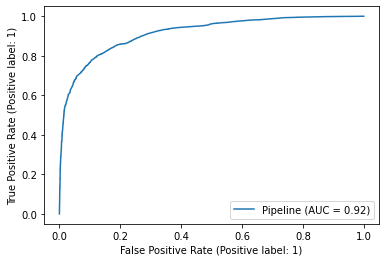

In [114]:
plot_roc_curve(lr_pip, X_test, y_test)
prob_test_est1 =  lr_pip.predict_proba(X_test)
roc_test1 = roc_auc_score(y_test, prob_test_est1[:,1])
roc_test1

In [115]:
#Developing a grid serach parameter optimization for regression using RFE (Selecting recursive variables)

vars_transformer = ColumnTransformer([('standarizer',StandardScaler(), selectedvars_ls),]) 

lr_pip = Pipeline([
    ('preprocessing', vars_transformer),
    ('model', RFE(LogisticRegression(random_state=0, fit_intercept=True))),
])

hyper_params = {'model__n_features_to_select': [30,40,50]} #Number of variables on each model trial

lr_search = GridSearchCV(estimator = lr_pip, 
                        param_grid = hyper_params, 
                        scoring= 'accuracy', 
                        cv = kf, 
                        verbose = 3,
                        return_train_score=True)

# fit the model
lr_search.fit(X_train, y_train)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

[CV 1/3] END model__n_features_to_select=30;, score=(train=0.832, test=0.833) total time=  11.4s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

[CV 2/3] END model__n_features_to_select=30;, score=(train=0.832, test=0.832) total time=  11.1s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

[CV 3/3] END model__n_features_to_select=30;, score=(train=0.833, test=0.830) total time=  12.0s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

[CV 1/3] END model__n_features_to_select=40;, score=(train=0.833, test=0.836) total time=   6.1s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

[CV 2/3] END model__n_features_to_select=40;, score=(train=0.833, test=0.832) total time=   6.1s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the doc

[CV 3/3] END model__n_features_to_select=40;, score=(train=0.834, test=0.830) total time=   6.5s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV 1/3] END model__n_features_to_select=50;, score=(train=0.833, test=0.835) total time=   0.8s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV 2/3] END model__n_features_to_select=50;, score=(train=0.833, test=0.833) total time=   0.7s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV 3/3] END model__n_features_to_select=50;, score=(train=0.834, test=0.830) total time=   0.7s


lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


GridSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('standarizer',
                                                                         StandardScaler(),
                                                                         ['initial_quantity',
                                                                          'listing_type_id_free',
                                                                          'listing_type_id_bronze',
                                                                          "non_mercado_pago_payment_methods_[{'description': "
                                                                          "'Transferencia "
                                                                          "bancaria', "
                                                                          "'id': "
                

In [116]:
# The best model optimazed is the same that elected in the beginning
y_train_est2 =  lr_search.predict(X_train)
accuracy_score_train2 = accuracy_score(y_train,y_train_est2)
accuracy_score_train2

0.8332296296296297

In [117]:
y_test_est2 =  lr_search.predict(X_test)
accuracy_score_test2 = accuracy_score(y_test,y_test_est2)
accuracy_score_test2

0.8368

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


0.9146412074688424

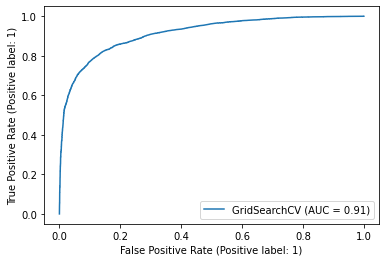

In [118]:
plot_roc_curve(lr_search, X_test, y_test)
prob_test_est2 =  lr_search.predict_proba(X_test)
roc_test2 = roc_auc_score(y_test, prob_test_est2[:,1])
roc_test2

# Trying LGBM modelling

In [119]:
# Defines the column transformer


lgbm_transformer = ColumnTransformer([('standarizer',StandardScaler(), selectedvars_ls),]) 

lgbm_pip = Pipeline([('preprocessing', lgbm_transformer),
                    ('model', LGBMClassifier())])

In [120]:
# grid of model hyperparameters to be optimised, you can look for parameters definitions in the model link
lgbm_params = {
    'model__objective': ['binary'],
    'model__boosting_type': ['gbdt'],
    'model__n_estimators': [500],  # Number of trees
    'model__max_depth': [20,30],
    'model__eta': [0.3, 0.1, 0.01],
    #'model__subsample': [0.3, 0.5, 0.7, 1],
    #'model__colsample_bytree': [0.3, 0.5, 0.7, 1],

    'model__eval_metric': ['accuracy'],
    'model__metric': ['accuracy'],

    #'model__early_stopping_round': [42],
    'model__eval_set' : [[X_test, y_test]],
}

# We launch a grid seach: testing different hyperparameters on a cross validation 
# and select the ones that optimises the performance of the mode 

lgbm_search = RandomizedSearchCV(lgbm_pip, lgbm_params,
                                 n_iter=20, # This is the number of parameters to test , you can choose more
                                 n_jobs=6, 
                                 cv=kf, 
                                 scoring='accuracy',
                                 verbose=3)

lgbm_search.fit(X_train, y_train)

The total space of parameters 6 is smaller than n_iter=20. Running 6 iterations. For exhaustive searches, use GridSearchCV.


Fitting 3 folds for each of 6 candidates, totalling 18 fits
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 0.0 is set=, 0.0= will be ignored. Current value: 0.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 0.0 is set=, 0.0= will be ignored. Current value: 0.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 0.0 is set=, 0.0= will be ignored. Current value: 0.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 1.0 is set=, 1.0= will be ignored. Current value: 1.0=
[LightGBM] [Warning] 0.0 is set=, 0.0= will be ignored. Current value: 0.0=
[LightGBM] [Warning] ... is 

RandomizedSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessing',
                                              ColumnTransformer(transformers=[('standarizer',
                                                                               StandardScaler(),
                                                                               ['initial_quantity',
                                                                                'listing_type_id_free',
                                                                                'listing_type_id_bronze',
                                                                                "non_mercado_pago_payment_methods_[{'description': "
                                                                                "'Transferencia "
                                                                                "bancaria', "
                                       

In [121]:
print('Best parameters :', lgbm_search.best_params_)
print('Best score (accuracy) :', lgbm_search.best_score_)

Best parameters : {'model__objective': 'binary', 'model__n_estimators': 500, 'model__metric': 'accuracy', 'model__max_depth': 30, 'model__eval_set': [       initial_quantity  listing_type_id_free  listing_type_id_bronze  \
80523               3.0                   0.0                     1.0   
80590               1.0                   1.0                     0.0   
51137               1.0                   0.0                     1.0   
60535               1.0                   0.0                     1.0   
49262               1.0                   1.0                     0.0   
...                 ...                   ...                     ...   
20328               1.0                   0.0                     0.0   
83255               1.0                   1.0                     0.0   
45393               1.0                   1.0                     0.0   
73763               3.5                   0.0                     0.0   
9973                1.0                   0.0  

In [122]:
y_train_est3 =  lgbm_search.predict(X_train)
accuracy_score_train3 = accuracy_score(y_train,y_train_est3)
accuracy_score_train3

0.8819851851851852

In [123]:
y_test_est3 =  lgbm_search.predict(X_test)
accuracy_score_test3 = accuracy_score(y_test,y_test_est3)
accuracy_score_test3

0.8626222222222222

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


0.9399951117556734

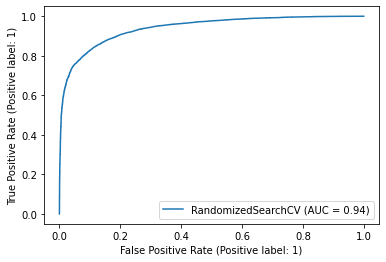

In [124]:
plot_roc_curve(lgbm_search, X_test, y_test)
prob_test_est3 =  lgbm_search.predict_proba(X_test)
roc_test3 = roc_auc_score(y_test, prob_test_est3[:,1])
roc_test3

# Random Forest Classifier

In [125]:
# Defines the column transformer

rfc_pip = Pipeline([
    ('model', RandomForestClassifier(random_state=0))
])

In [126]:
# grid of model hyperparameters to be optimised, you can look for parameters definitions in the model link
rfc_params = {
    'model__n_estimators': [200,500],  # Number of trees
    'model__max_depth': [10,20],
    'model__criterion': ['entropy'],
    #'model__eval_set' : [[X_test, y_test]],
}

# We launch a grid seach: testing different hyperparameters on a cross validation 
# and select the ones that optimises the performance of the mode 

rfc_search = RandomizedSearchCV(rfc_pip, rfc_params,
                                 n_iter=20, # This is the number of parameters to test , you can choose more
                                 n_jobs=6, 
                                 cv=kf, 
                                 scoring='accuracy',
                                 verbose=3)

rfc_search.fit(X_train, y_train)

The total space of parameters 4 is smaller than n_iter=20. Running 4 iterations. For exhaustive searches, use GridSearchCV.


Fitting 3 folds for each of 4 candidates, totalling 12 fits


RandomizedSearchCV(cv=KFold(n_splits=3, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('model',
                                              RandomForestClassifier(random_state=0))]),
                   n_iter=20, n_jobs=6,
                   param_distributions={'model__criterion': ['entropy'],
                                        'model__max_depth': [10, 20],
                                        'model__n_estimators': [200, 500]},
                   scoring='accuracy', verbose=3)

In [127]:
print('Best parameters :', rfc_search.best_params_)
print('Best score (accuracy) :', rfc_search.best_score_)

Best parameters : {'model__n_estimators': 500, 'model__max_depth': 20, 'model__criterion': 'entropy'}
Best score (accuracy) : 0.8534962962962963


In [128]:
y_train_est4 =  rfc_search.predict(X_train)
accuracy_score_train4 = accuracy_score(y_train,y_train_est4)
accuracy_score_train4

0.8872148148148148

In [129]:
y_test_est4 =  rfc_search.predict(X_test)
accuracy_score_test4 = accuracy_score(y_test,y_test_est4)
accuracy_score_test4

0.8582222222222222

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


0.9361688658533123

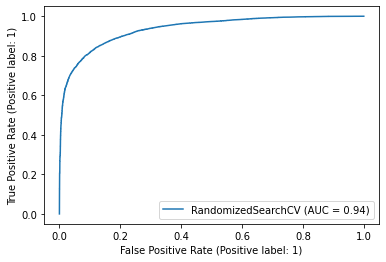

In [130]:
plot_roc_curve(rfc_search, X_test, y_test)
prob_test_est4 =  rfc_search.predict_proba(X_test)
roc_test4 = roc_auc_score(y_test, prob_test_est4[:,1])
roc_test4

In [131]:
#rfc_search.get_params().keys()

# Models comparison

In [132]:
print(f'Full variables model logistic regression accuracy: {accuracy_score_test1}')
print(f'Selected logistic regression model with RFE optimization accuracy: {accuracy_score_test2}')
print(f'Selected lgbm classifier model with grid searching accuracy: {accuracy_score_test3}')
print(f'Selected random forest classifier model with grid searching accuracy: {accuracy_score_test4}')

Full variables model logistic regression accuracy: 0.8348444444444444
Selected logistic regression model with RFE optimization accuracy: 0.8368
Selected lgbm classifier model with grid searching accuracy: 0.8626222222222222
Selected random forest classifier model with grid searching accuracy: 0.8582222222222222


In [133]:
print(f'Full variables model logistic regression roc: {roc_test1}')
print(f'Selected logistic regression model with RFE optimization roc: {roc_test2}')
print(f'Selected lgbm classifier model with grid searching roc: {roc_test3}')
print(f'Selected random forest classifier model with grid searching roc: {roc_test4}')

Full variables model logistic regression roc: 0.9153494607824391
Selected logistic regression model with RFE optimization roc: 0.9146412074688424
Selected lgbm classifier model with grid searching roc: 0.9399951117556734
Selected random forest classifier model with grid searching roc: 0.9361688658533123


In [134]:
confusion_matrix(y_test, y_test_est3)

array([[ 8992,  1387],
       [ 1704, 10417]], dtype=int64)

In [135]:
print(X_train.shape)
print(X_test.shape)

(67500, 50)
(22500, 50)


# Variable importance

In [136]:
#Variable importance

result = permutation_importance(lgbm_search, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2, scoring= 'accuracy')
sorted_idx = result.importances_mean.argsort()

In [137]:
features_df = pd.DataFrame(X_test.columns[sorted_idx], columns=['variable'])
features_df = features_df.reset_index()

def new_var_name(x):
    variable = str(x['variable'])
    index = x['index']
    
    text_cr_ls = [
        'non_mercado_pago_payment_methods_',
        'shipping.free_methods_'
    ]
    
    output = variable
    
    for t in text_cr_ls:
        if  t in variable:
            output = t + str(index)
            
    return output

features_df['new_var_name'] = features_df.apply(lambda x: new_var_name(x), axis=1)
features_df

,index,variable,new_var_name
0,0,non_mercado_pago_payment_methods_NA2,non_mercado_pago_payment_methods_0
1,1,"tags_['good_quality_thumbnail', 'dragged_bids_...","tags_['good_quality_thumbnail', 'dragged_bids_..."
2,2,tags_['good_quality_thumbnail'],tags_['good_quality_thumbnail']
3,3,non_mercado_pago_payment_methods_[{'descriptio...,non_mercado_pago_payment_methods_3
4,4,shipping.mode_me1,shipping.mode_me1
5,5,non_mercado_pago_payment_methods_[{'descriptio...,non_mercado_pago_payment_methods_5
6,6,shipping.free_methods_NA,shipping.free_methods_6
7,7,non_mercado_pago_payment_methods_[{'descriptio...,non_mercado_pago_payment_methods_7
8,8,non_mercado_pago_payment_methods_[{'descriptio...,non_mercado_pago_payment_methods_8
9,9,non_mercado_pago_payment_methods_[{'descriptio...,non_mercado_pago_payment_methods_9


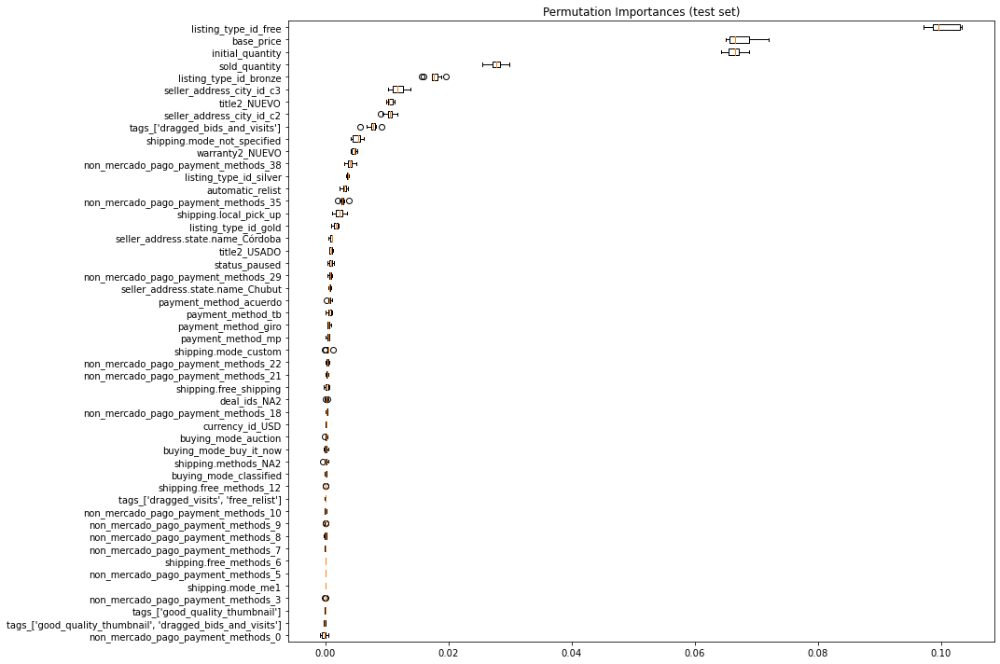

In [138]:
fig, ax = plt.subplots(figsize=(15,10))
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=features_df['new_var_name'].tolist())
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

In [139]:
# Shap values

# Create a random subset of data to acceleration computation of shap values and PdP
np.random.seed(seed=1234)
random_nb = np.random.choice(range(0, X_test.shape[0]), 1000)

X_choose = X_test.iloc[random_nb].reset_index(drop=True)

# Shap package struggles with pipeline, so we transform the X_choose here
X_choose= lgbm_search.best_estimator_.named_steps['preprocessing'].transform(X_choose)
print(X_choose.shape)

(1000, 50)


In [141]:
X_choose.shape

(1000, 50)

In [142]:
#Retrieves variable names for shap

ls_catcols_nopca_tr = lgbm_search.best_estimator_['preprocessing'].transformers_[0][2]

ls_shnames = ls_catcols_nopca_tr

X_choose = pd.DataFrame(X_choose,columns=ls_shnames)

print(X_choose.shape)
X_choose

(1000, 50)


,initial_quantity,listing_type_id_free,listing_type_id_bronze,"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Tarjeta de crédito', 'id': 'MLAOT', 'type': 'N'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",automatic_relist,listing_type_id_silver,sold_quantity,payment_method_tb,shipping.free_shipping,shipping.methods_NA2,...,"non_mercado_pago_payment_methods_[{'description': 'Cheque certificado', 'id': 'MLABC', 'type': 'G'}, {'description': 'Contra reembolso', 'id': 'MLACD', 'type': 'G'}, {'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Giro postal', 'id': 'MLAWT', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]","non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",tags_['good_quality_thumbnail'],"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}]","non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",shipping.mode_me1,"non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Giro postal', 'id': 'MLAWT', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",tags_['dragged_bids_and_visits'],seller_address_city_id_c3,currency_id_USD
0,-0.621626,-0.521905,0.762221,-0.511364,-0.220843,-0.315934,-0.179760,0.969214,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,0.017812,-0.0775
1,-0.621626,-0.521905,0.762221,-0.511364,-0.220843,-0.315934,-0.179760,0.969214,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,-1.628316,-1.681421,-0.0775
2,-0.621626,1.916059,-1.311955,1.955552,-0.220843,-0.315934,-0.179760,0.969214,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,-0.355149,-0.0775
3,-0.621626,1.916059,-1.311955,-0.511364,-0.220843,-0.315934,-0.179760,-1.031763,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,-0.544198,-0.0775
4,1.772054,-0.521905,0.762221,-0.511364,-0.220843,-0.315934,-0.179760,-1.031763,5.716873,-5.725713,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,0.017812,-0.0775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.772054,-0.521905,0.762221,1.955552,-0.220843,-0.315934,-0.179760,0.969214,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,-0.322438,-0.0775
996,-0.621626,1.916059,-1.311955,-0.511364,-0.220843,-0.315934,-0.179760,0.969214,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,0.017812,-0.0775
997,-0.621626,-0.521905,0.762221,-0.511364,-0.220843,-0.315934,0.047149,0.969214,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,0.614132,0.017812,-0.0775
998,-0.621626,-0.521905,0.762221,-0.511364,-0.220843,-0.315934,-0.179760,-1.031763,-0.174921,0.174651,...,-0.031285,-0.164479,-0.061943,-0.078557,-0.092284,-0.030565,-0.028296,-1.628316,-0.387426,-0.0775


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.


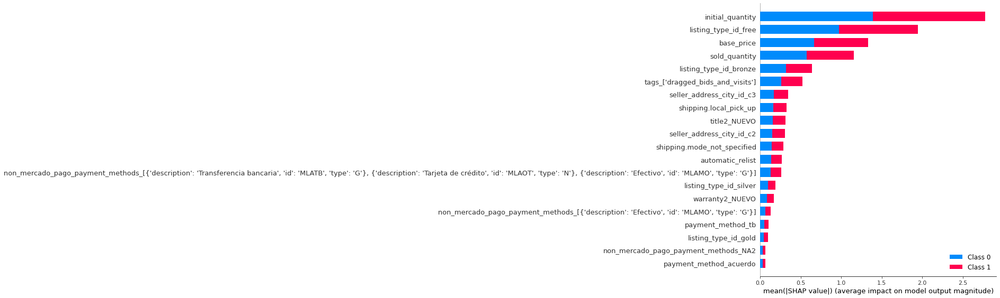

In [143]:
# Variable importance shap values
explainer = shap.TreeExplainer(lgbm_search.best_estimator_.named_steps['model'])
shap_values = explainer.shap_values(X_choose)
shap.summary_plot(shap_values, X_choose)

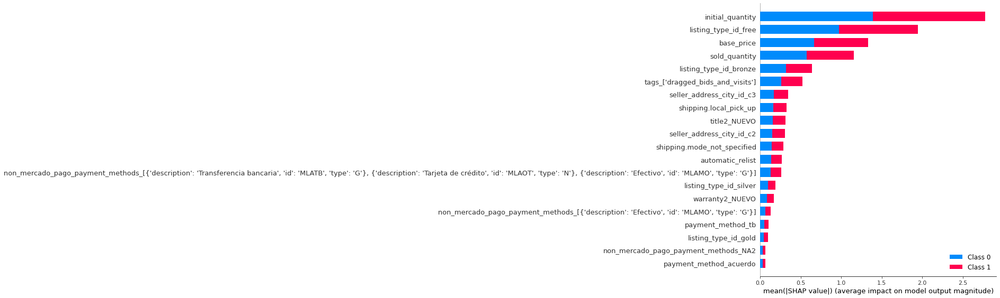

In [144]:
# The same plot than before, except that it's with bars, If you have a variable that is way more predictive 
# Than all the other, you should check if you don't have target leakage in the variable
shap.summary_plot(shap_values, X_choose, plot_type='bar')

# Predict new data

## Get data

In [145]:
Xt_val_df = pd.json_normalize(X_val)
Xt_val_df = Xt_val_df.reset_index(drop=True).copy()
print(Xt_val_df.shape)
Xt_val_df

(10000, 56)


,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,seller_address.state.id,seller_address.city.name,seller_address.city.id,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods
0,None,[],used,[],6700.0,"[{'description': 'Transferencia bancaria', 'id...",6469674142,[],MLA,silver,...,AR-B,General Rodríguez,TUxBQ0dFTjY4NTg,True,[],[],False,custom,None,NaN
1,Sí,[],new,[],119.0,[],5921388606,[],MLA,bronze,...,AR-C,MICROCENTRO,,False,[],[],False,not_specified,None,NaN
2,Sí,[],new,[],450.0,[],5675694703,[],MLA,bronze,...,AR-B,Morón,TUxBQ01PUmI1NTBj,False,[],[],False,me2,None,NaN
3,Sí,[],used,[],40.0,"[{'description': 'Transferencia bancaria', 'id...",8566233865,[],MLA,bronze,...,AR-B,acassuso,,True,[],[],False,me2,None,NaN
4,None,[],new,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",9453231792,[],MLA,bronze,...,AR-C,Palermo,TUxBQlBBTDI1MTVa,True,[],[],False,not_specified,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,None,[],used,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",1455091083,[],MLA,free,...,AR-B,Don Torcuato,,True,[],[],False,me2,None,NaN
9996,None,[],new,[],239.0,"[{'description': 'Tarjeta de crédito', 'id': '...",2483727970,[],MLA,bronze,...,AR-B,Lomas de Zamora,TUxBQ0xPTWMwNjk3,False,[],[],False,not_specified,None,NaN
9997,None,[],used,[],600.0,[],7300544890,[{'attribute_combinations': [{'value_id': '920...,MLA,bronze,...,AR-B,Morón,TUxBQ01PUmI1NTBj,False,[],[],False,me2,None,NaN
9998,"Buen estado, se verifica al entregar. la total...",[],used,[],50.0,"[{'description': 'Transferencia bancaria', 'id...",6600908485,[],MLA,bronze,...,AR-C,Balvanera,TUxBQkJBTDMxMDZa,True,[],[],False,me2,None,NaN


In [146]:
Xt_val_df.columns

Index(['warranty', 'sub_status', 'condition', 'deal_ids', 'base_price',
       'non_mercado_pago_payment_methods', 'seller_id', 'variations',
       'site_id', 'listing_type_id', 'price', 'attributes', 'buying_mode',
       'tags', 'listing_source', 'parent_item_id', 'coverage_areas',
       'category_id', 'descriptions', 'last_updated',
       'international_delivery_mode', 'pictures', 'id', 'official_store_id',
       'differential_pricing', 'accepts_mercadopago', 'original_price',
       'currency_id', 'thumbnail', 'title', 'automatic_relist', 'date_created',
       'secure_thumbnail', 'stop_time', 'status', 'video_id',
       'catalog_product_id', 'subtitle', 'initial_quantity', 'start_time',
       'permalink', 'sold_quantity', 'available_quantity',
       'seller_address.country.name', 'seller_address.country.id',
       'seller_address.state.name', 'seller_address.state.id',
       'seller_address.city.name', 'seller_address.city.id',
       'shipping.local_pick_up', 'shipping.m

## Replicate Tranformations

In [147]:
# Replicate target

def target_f(x):
    cond = str(x['condition']).strip()
    
    output = 0
    if cond in ['new']:
        output = 1
        
    return output
    
    
Xt_val_df['target'] = Xt_val_df.apply(lambda x: target_f(x), axis=1)

Xt_val_df.value_counts(['target'])

target
1         5406
0         4594
dtype: int64

In [148]:
## Replicate numerical imputations

df_input = Xt_val_df.copy()
iqr_2_df = iqr_2_df.copy()

def calculate_quantile(i,df2):
    median_var = df2[[i]].quantile(0.5)[0]
    Q1 = df2[[i]].quantile(0.25)[0]
    Q3 = df2[[i]].quantile(0.75)[0]
    IQR = Q3 - Q1
    min_var = df2[[i]].min()[0]
    max_var = df2[[i]].max()[0]
    min_IQR = Q1 - 1.5*IQR
    max_IQR = Q3 + 1.5*IQR
    
    return median_var, Q1, Q3, min_var, max_var, min_IQR, max_IQR

def calculate_interval(i,df2):
    mean_var = df2[[i]].mean()[0]
    std_var = df2[[i]].std()[0]

    return mean_var, std_var


#find and interpolate the outliers

for i in numvars_ls:
    print('\nAttribute-',i,':')
    
    iqr_df = iqr_2_df[iqr_2_df['variable']==i].copy()
    min_IQR = iqr_df['min_IQR'].iloc[0]
    max_IQR = iqr_df['max_IQR'].iloc[0]
    
    print(f'min_IQR: {min_IQR}')
    print(f'max_IQR: {max_IQR}')
    print(f'mean_var: {mean_var}')
    
    # Fixing outliers
    def fix_outliers(x, max_IQR=max_IQR, min_IQR=min_IQR):
            
        if (x > max_IQR):
            x = max_IQR
        if (x < min_IQR):
            x = min_IQR
        else:
            x=x
            
        return x

    df_input[i] = df_input[i].map(fix_outliers)
    
    
    def fix_missings(x, mean_var=mean_var):
        if (x == np.nan) | (x == None):
            x = mean_var
        if not x==x:
            x = mean_var
        else:
            x=x
        return x
    
    df_input[i] = df_input[i].map(fix_missings)

    if(len(df_input[df_input[i].isnull()][i])==0):
        print('WU -> Outliers has been interpolated')
    else:
        print('WU -> MISSING VALUES OBSERVED')
        
 
Xt_val2_df = df_input.copy()
print(Xt_val2_df.shape)


Attribute- base_price :
min_IQR: -975.0
max_IQR: 1865.0
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- seller_id :
min_IQR: -3595207957.0
max_IQR: 14485012299.0
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- price :
min_IQR: -975.0
max_IQR: 1865.0
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- official_store_id :
min_IQR: -3349.0
max_IQR: 15155.0
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- original_price :
min_IQR: -1127.5
max_IQR: 3076.5
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- stop_time :
min_IQR: 1442387615125.0
max_IQR: 1452855976125.0
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- catalog_product_id :
min_IQR: -1296628.75
max_IQR: 7295761.25
mean_var: 0.5372444444444444
WU -> Outliers has been interpolated

Attribute- initial_quantity :
min_IQR: -0.5
max_IQR: 3.5
mean_var: 0.5372444444444

In [149]:
output_data = Xt_val2_df['date_created'].apply(lambda x: fix_dates_f(x))
output_df = pd.DataFrame(output_data.tolist(),columns=['date_created','days_up_today'])
output_df

Xt_val2_df['date_created'] = output_df['date_created']
Xt_val2_df['days_up_today'] = output_df['days_up_today']

Xt_val2_df

,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,seller_address.city.id,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods,target,days_up_today
0,None,[],used,[],1865.0,"[{'description': 'Transferencia bancaria', 'id...",6469674142,[],MLA,silver,...,TUxBQ0dFTjY4NTg,True,[],[],False,custom,None,NaN,0,37
1,Sí,[],new,[],119.0,[],5921388606,[],MLA,bronze,...,,False,[],[],False,not_specified,None,NaN,1,47
2,Sí,[],new,[],450.0,[],5675694703,[],MLA,bronze,...,TUxBQ01PUmI1NTBj,False,[],[],False,me2,None,NaN,1,22
3,Sí,[],used,[],40.0,"[{'description': 'Transferencia bancaria', 'id...",8566233865,[],MLA,bronze,...,,True,[],[],False,me2,None,NaN,0,60
4,None,[],new,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",9453231792,[],MLA,bronze,...,TUxBQlBBTDI1MTVa,True,[],[],False,not_specified,None,NaN,1,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,None,[],used,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",1455091083,[],MLA,free,...,,True,[],[],False,me2,None,NaN,0,17
9996,None,[],new,[],239.0,"[{'description': 'Tarjeta de crédito', 'id': '...",2483727970,[],MLA,bronze,...,TUxBQ0xPTWMwNjk3,False,[],[],False,not_specified,None,NaN,1,34
9997,None,[],used,[],600.0,[],7300544890,[{'attribute_combinations': [{'value_id': '920...,MLA,bronze,...,TUxBQ01PUmI1NTBj,False,[],[],False,me2,None,NaN,0,39
9998,"Buen estado, se verifica al entregar. la total...",[],used,[],50.0,"[{'description': 'Transferencia bancaria', 'id...",6600908485,[],MLA,bronze,...,TUxBQkJBTDMxMDZa,True,[],[],False,me2,None,NaN,0,58


In [150]:
Xt_val2_df['mp_nro_payment_methods'] = Xt_val2_df['non_mercado_pago_payment_methods'].apply(lambda x: mp_payment_methods_f(x))
Xt_val2_df

,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods,target,days_up_today,mp_nro_payment_methods
0,None,[],used,[],1865.0,"[{'description': 'Transferencia bancaria', 'id...",6469674142,[],MLA,silver,...,True,[],[],False,custom,None,NaN,0,37,3
1,Sí,[],new,[],119.0,[],5921388606,[],MLA,bronze,...,False,[],[],False,not_specified,None,NaN,1,47,0
2,Sí,[],new,[],450.0,[],5675694703,[],MLA,bronze,...,False,[],[],False,me2,None,NaN,1,22,0
3,Sí,[],used,[],40.0,"[{'description': 'Transferencia bancaria', 'id...",8566233865,[],MLA,bronze,...,True,[],[],False,me2,None,NaN,0,60,3
4,None,[],new,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",9453231792,[],MLA,bronze,...,True,[],[],False,not_specified,None,NaN,1,51,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,None,[],used,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",1455091083,[],MLA,free,...,True,[],[],False,me2,None,NaN,0,17,2
9996,None,[],new,[],239.0,"[{'description': 'Tarjeta de crédito', 'id': '...",2483727970,[],MLA,bronze,...,False,[],[],False,not_specified,None,NaN,1,34,2
9997,None,[],used,[],600.0,[],7300544890,[{'attribute_combinations': [{'value_id': '920...,MLA,bronze,...,False,[],[],False,me2,None,NaN,0,39,0
9998,"Buen estado, se verifica al entregar. la total...",[],used,[],50.0,"[{'description': 'Transferencia bancaria', 'id...",6600908485,[],MLA,bronze,...,True,[],[],False,me2,None,NaN,0,58,2


In [151]:
outputs_data = Xt_val2_df['non_mercado_pago_payment_methods'].apply(lambda x: payment_method_tb_f(x))
cols_ls = [
    'payment_method_tb', 
    'payment_method_tc', 
    'payment_method_ef',
    'payment_method_acuerdo',
    'payment_method_giro',
    'payment_method_mp',
]

outputs_df = pd.DataFrame(outputs_data.tolist(), columns=cols_ls)
Xt_val2_df[cols_ls] = outputs_df[cols_ls]

for v in cols_ls:
    print(Xt_val2_df.value_counts(v))


Xt_val2_df

payment_method_tb
1    5169
0    4831
dtype: int64
payment_method_tc
0    9919
1      81
dtype: int64
payment_method_ef
1    6709
0    3291
dtype: int64
payment_method_acuerdo
0    9184
1     816
dtype: int64
payment_method_giro
0    9824
1     176
dtype: int64
payment_method_mp
0    9926
1      74
dtype: int64


,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,shipping.free_methods,target,days_up_today,mp_nro_payment_methods,payment_method_tb,payment_method_tc,payment_method_ef,payment_method_acuerdo,payment_method_giro,payment_method_mp
0,None,[],used,[],1865.0,"[{'description': 'Transferencia bancaria', 'id...",6469674142,[],MLA,silver,...,NaN,0,37,3,1,0,1,0,0,0
1,Sí,[],new,[],119.0,[],5921388606,[],MLA,bronze,...,NaN,1,47,0,0,0,0,0,0,0
2,Sí,[],new,[],450.0,[],5675694703,[],MLA,bronze,...,NaN,1,22,0,0,0,0,0,0,0
3,Sí,[],used,[],40.0,"[{'description': 'Transferencia bancaria', 'id...",8566233865,[],MLA,bronze,...,NaN,0,60,3,1,0,1,0,0,0
4,None,[],new,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",9453231792,[],MLA,bronze,...,NaN,1,51,2,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,None,[],used,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",1455091083,[],MLA,free,...,NaN,0,17,2,1,0,1,0,0,0
9996,None,[],new,[],239.0,"[{'description': 'Tarjeta de crédito', 'id': '...",2483727970,[],MLA,bronze,...,NaN,1,34,2,0,0,1,0,0,0
9997,None,[],used,[],600.0,[],7300544890,[{'attribute_combinations': [{'value_id': '920...,MLA,bronze,...,NaN,0,39,0,0,0,0,0,0,0
9998,"Buen estado, se verifica al entregar. la total...",[],used,[],50.0,"[{'description': 'Transferencia bancaria', 'id...",6600908485,[],MLA,bronze,...,NaN,0,58,2,1,0,1,0,0,0


In [152]:
Xt_val2_df['title2'] = Xt_val2_df['title'].apply(lambda x: title2_f(x))

obs_df = Xt_val2_df.groupby(
    ['title2'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    pp_target = ('target','mean'),
)

obs_df

,title2,regs,pp_target
0,DANADO,3,0.333333
1,NA,9586,0.533799
2,NUEVO,336,0.836310
3,USADO,75,0.093333


In [153]:
Xt_val2_df['warranty2'] = Xt_val2_df['warranty'].apply(lambda x: warranty2_f(x))

obs_df = Xt_val2_df.groupby(
    ['warranty2'],
    as_index=False,
    dropna=False
).agg(
    regs = ('target','count'),
    pp_target = ('target','mean'),
)

obs_df

,warranty2,regs,pp_target
0,NA,9873,0.536716
1,NUEVO,104,0.942308
2,USADO,23,0.391304


In [154]:
def fix_category(x):
    output = str(x).strip()
    if output in [None,'None','','nan','NAN','NaN',[],'[]']:
        output = 'NA'
    return output


for v in catvar_targetenc_ls:
    Xt_val2_df[v] = Xt_val2_df[v].apply(lambda x: fix_category(x))
    
Xt_val2_df[catvar_targetenc_ls]

,video_id,attributes,seller_address.city.name,variations,warranty,title
0,NA,NA,General Rodríguez,NA,NA,Escritorio Secretter Espectacular
1,NA,NA,MICROCENTRO,NA,Sí,Stassen Espatulas Milenio Numero 3 Codigo 590-3
2,NA,NA,Morón,NA,Sí,Charm Britania Plata 925 Ovalado!!! Armá La Tu...
3,NA,NA,acassuso,NA,Sí,El Hombre De Magallanes Virginia Carreño Novela
4,NA,NA,Palermo,NA,NA,Molde Placa Boca Espejo Bota Labial Chupetin P...
...,...,...,...,...,...,...
9995,NA,NA,Don Torcuato,NA,NA,El Corazon De Las Tinieblas - Conrad - Bibliot...
9996,NA,NA,Lomas de Zamora,NA,NA,Juego De Toalla Y Toallon Franco Valente Var...
9997,NA,"[{'value_id': 'male', 'attribute_group_id': 'D...",Morón,[{'attribute_combinations': [{'value_id': '920...,NA,Campera De Cuero Negra
9998,NA,NA,Balvanera,NA,"Buen estado, se verifica al entregar. la total...","Psicodrama Y Teatro Moderno, Jean Fanchette. F2"


In [155]:
catvar_targetenc2_df = tet.transform(Xt_val2_df)
catvar_targetenc2_df = pd.DataFrame(catvar_targetenc2_df, columns=catvar_targetenc_ls)

Xt_val2_df[catvar_targetenc_ls] = catvar_targetenc2_df[catvar_targetenc_ls]
Xt_val2_df[catvar_targetenc_ls]

,video_id,attributes,seller_address.city.name,variations,warranty,title
0,0.53006,0.528535,0.461538,0.533876,0.483317,0.537244
1,0.53006,0.528535,0.504132,0.533876,0.424907,0.537244
2,0.53006,0.528535,0.591182,0.533876,0.424907,0.537244
3,0.53006,0.528535,0.322581,0.533876,0.424907,0.537244
4,0.53006,0.528535,0.649416,0.533876,0.483317,0.537244
...,...,...,...,...,...,...
9995,0.53006,0.528535,0.388350,0.533876,0.483317,0.537244
9996,0.53006,0.528535,0.597997,0.533876,0.483317,0.537244
9997,0.53006,0.450128,0.591182,0.537244,0.483317,0.537244
9998,0.53006,0.528535,0.604762,0.533876,0.000001,0.537244


In [156]:
def fix_category(x):
    output = str(x).strip()
    if output in [None,'None','','nan','NAN','NaN']:
        output = 'NA'
    if output in [[],'[]']:
        output = 'NA2'
    return output


for v in catvars_filtered3_ls:
    Xt_val2_df[v] = Xt_val2_df[v].apply(lambda x: fix_category(x))
    
Xt_val2_df[catvars_filtered3_ls]

,sub_status,deal_ids,non_mercado_pago_payment_methods,listing_type_id,buying_mode,tags,currency_id,status,seller_address.country.name,seller_address.state.name,seller_address.city.id,shipping.methods,shipping.tags,shipping.mode,shipping.dimensions,shipping.free_methods,title2,warranty2
0,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",silver,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Buenos Aires,TUxBQ0dFTjY4NTg,NA2,NA2,custom,NA,NA,NA,NA
1,NA2,NA2,NA2,bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Capital Federal,NA,NA2,NA2,not_specified,NA,NA,NA,NA
2,NA2,NA2,NA2,bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Buenos Aires,TUxBQ01PUmI1NTBj,NA2,NA2,me2,NA,NA,NA,NA
3,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Buenos Aires,NA,NA2,NA2,me2,NA,NA,NA,NA
4,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Capital Federal,TUxBQlBBTDI1MTVa,NA2,NA2,not_specified,NA,NA,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",free,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Buenos Aires,NA,NA2,NA2,me2,NA,NA,NA,NA
9996,NA2,NA2,"[{'description': 'Tarjeta de crédito', 'id': '...",bronze,buy_it_now,NA2,ARS,active,Argentina,Buenos Aires,TUxBQ0xPTWMwNjk3,NA2,NA2,not_specified,NA,NA,NA,NA
9997,NA2,NA2,NA2,bronze,buy_it_now,NA2,ARS,active,Argentina,Buenos Aires,TUxBQ01PUmI1NTBj,NA2,NA2,me2,NA,NA,NA,NA
9998,NA2,NA2,"[{'description': 'Transferencia bancaria', 'id...",bronze,buy_it_now,['dragged_bids_and_visits'],ARS,active,Argentina,Capital Federal,TUxBQkJBTDMxMDZa,NA2,NA2,me2,NA,NA,NA,NA


In [157]:
catvar_onehotenc2_df = oht.transform(Xt_val2_df)
catvar_onehotenc2_df = pd.DataFrame(catvar_onehotenc2_df,columns = catvar_onehotenc_ls)
catvar_onehotenc2_df

Xt_val3_df = Xt_val2_df.drop(columns=catvars_filtered3_ls).copy()
Xt_val3_df[catvar_onehotenc_ls] = catvar_onehotenc2_df[catvar_onehotenc_ls]
Xt_val3_df = Xt_val3_df.copy()
print(Xt_val3_df.shape)
Xt_val3_df

Found unknown categories in columns [1, 2, 10] during transform. These unknown categories will be encoded as all zeros
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has po

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

(10000, 627)


,warranty,condition,base_price,seller_id,variations,site_id,price,attributes,listing_source,parent_item_id,...,"shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}, {'rule': {'value': None, 'free_mode': 'country'}, 'id': 73330}]","shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73328}]","shipping.free_methods_[{'rule': {'value': None, 'free_mode': 'country'}, 'id': 73330}]",title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO
0,0.483317,used,1865.0,6469674142,0.533876,MLA,1865.0,0.528535,,MLA2392767270,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.424907,new,119.0,5921388606,0.533876,MLA,119.0,0.528535,,MLA9748425635,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,0.424907,new,450.0,5675694703,0.533876,MLA,450.0,0.528535,,MLA6473720967,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.424907,used,40.0,8566233865,0.533876,MLA,40.0,0.528535,,MLA8815658620,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,0.483317,new,30.0,9453231792,0.533876,MLA,30.0,0.528535,,MLA3726984235,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.483317,used,30.0,1455091083,0.533876,MLA,30.0,0.528535,,MLA9574286389,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
9996,0.483317,new,239.0,2483727970,0.533876,MLA,239.0,0.528535,,MLA6310915061,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
9997,0.483317,used,600.0,7300544890,0.537244,MLA,600.0,0.450128,,None,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
9998,0.000001,used,50.0,6600908485,0.533876,MLA,50.0,0.528535,,MLA6491109186,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [158]:
pcavar2_df = pcat.transform(Xt_val3_df)

pcavars_adj_ls = [
    'seller_address_city_id_c1',
    'seller_address_city_id_c2',
    'seller_address_city_id_c3'
]

pcavar2_df = pd.DataFrame(pcavar2_df, columns=pcavars_adj_ls)
pcavar2_df

,seller_address_city_id_c1,seller_address_city_id_c2,seller_address_city_id_c3
0,0.527796,-0.032092,-0.052038
1,-0.459501,0.001956,0.002724
2,0.538223,-0.038067,-0.063556
3,-0.459501,0.001956,0.002724
4,0.605184,0.891256,0.264989
...,...,...,...
9995,-0.459501,0.001956,0.002724
9996,0.543214,-0.041676,-0.070829
9997,0.538223,-0.038067,-0.063556
9998,0.552414,-0.050242,-0.089306


In [159]:
Xt_val32_df = Xt_val3_df.drop(columns=pcavars_ls).copy()
Xt_val32_df[pcavars_adj_ls] = pcavar2_df[pcavars_adj_ls]
Xt_val32_df = Xt_val32_df.copy()
print(Xt_val32_df.shape)
Xt_val32_df

(10000, 345)


,warranty,condition,base_price,seller_id,variations,site_id,price,attributes,listing_source,parent_item_id,...,title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO,seller_address_city_id_c1,seller_address_city_id_c2,seller_address_city_id_c3
0,0.483317,used,1865.0,6469674142,0.533876,MLA,1865.0,0.528535,,MLA2392767270,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.527796,-0.032092,-0.052038
1,0.424907,new,119.0,5921388606,0.533876,MLA,119.0,0.528535,,MLA9748425635,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
2,0.424907,new,450.0,5675694703,0.533876,MLA,450.0,0.528535,,MLA6473720967,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.538223,-0.038067,-0.063556
3,0.424907,used,40.0,8566233865,0.533876,MLA,40.0,0.528535,,MLA8815658620,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
4,0.483317,new,30.0,9453231792,0.533876,MLA,30.0,0.528535,,MLA3726984235,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.605184,0.891256,0.264989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.483317,used,30.0,1455091083,0.533876,MLA,30.0,0.528535,,MLA9574286389,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,-0.459501,0.001956,0.002724
9996,0.483317,new,239.0,2483727970,0.533876,MLA,239.0,0.528535,,MLA6310915061,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.543214,-0.041676,-0.070829
9997,0.483317,used,600.0,7300544890,0.537244,MLA,600.0,0.450128,,None,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.538223,-0.038067,-0.063556
9998,0.000001,used,50.0,6600908485,0.533876,MLA,50.0,0.528535,,MLA6491109186,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.552414,-0.050242,-0.089306


In [160]:
Xt_val4_df = Xt_val32_df[final_variables_ls]
print(Xt_val4_df.shape)
Xt_val4_df

(10000, 316)


,accepts_mercadopago,automatic_relist,available_quantity,base_price,buying_mode_auction,buying_mode_buy_it_now,buying_mode_classified,currency_id_USD,days_up_today,deal_ids_NA2,...,"tags_['poor_quality_thumbnail', 'dragged_bids_and_visits']",tags_['poor_quality_thumbnail'],target,title2_DANADO,title2_NA,title2_NUEVO,title2_USADO,warranty2_NA,warranty2_NUEVO,warranty2_USADO
0,True,False,1.0,1865.0,0.0,1.0,0.0,0.0,37,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,True,False,3.5,119.0,0.0,1.0,0.0,0.0,47,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,True,False,2.0,450.0,0.0,1.0,0.0,0.0,22,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,True,False,1.0,40.0,0.0,1.0,0.0,0.0,60,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,True,False,1.0,30.0,0.0,1.0,0.0,0.0,51,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,True,False,1.0,30.0,0.0,1.0,0.0,0.0,17,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
9996,True,False,3.5,239.0,0.0,1.0,0.0,0.0,34,1.0,...,0.0,0.0,1,0.0,1.0,0.0,0.0,1.0,0.0,0.0
9997,True,False,1.0,600.0,0.0,1.0,0.0,0.0,39,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
9998,True,False,1.0,50.0,0.0,1.0,0.0,0.0,58,1.0,...,0.0,0.0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [161]:
#Prepares the analysis df
scoring_df = Xt_val4_df[totalvars_ls]
print(scoring_df.shape)
scoring_df

(10000, 51)


,initial_quantity,listing_type_id_free,listing_type_id_bronze,"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Tarjeta de crédito', 'id': 'MLAOT', 'type': 'N'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",automatic_relist,listing_type_id_silver,sold_quantity,payment_method_tb,shipping.free_shipping,shipping.methods_NA2,...,"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}, {'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",tags_['good_quality_thumbnail'],"non_mercado_pago_payment_methods_[{'description': 'Transferencia bancaria', 'id': 'MLATB', 'type': 'G'}]","non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",shipping.mode_me1,"non_mercado_pago_payment_methods_[{'description': 'Acordar con el comprador', 'id': 'MLAWC', 'type': 'G'}, {'description': 'Giro postal', 'id': 'MLAWT', 'type': 'G'}, {'description': 'Efectivo', 'id': 'MLAMO', 'type': 'G'}]",tags_['dragged_bids_and_visits'],seller_address_city_id_c3,currency_id_USD,target
0,1.0,0.0,0.0,1.0,False,1.0,0.0,1,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.052038,0.0,0
1,3.5,0.0,1.0,0.0,False,0.0,0.0,0,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.002724,0.0,1
2,2.0,0.0,1.0,0.0,False,0.0,0.0,0,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.063556,0.0,1
3,1.0,0.0,1.0,1.0,False,0.0,0.0,1,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.002724,0.0,0
4,1.0,0.0,1.0,0.0,False,0.0,1.0,1,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.264989,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.0,1.0,0.0,0.0,False,0.0,0.0,1,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.002724,0.0,0
9996,3.5,0.0,1.0,0.0,False,0.0,0.0,0,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.070829,0.0,1
9997,1.0,0.0,1.0,0.0,False,0.0,0.0,0,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.063556,0.0,0
9998,1.0,0.0,1.0,0.0,False,0.0,0.0,1,False,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.089306,0.0,0


## Make predictions

In [162]:
#Defines X vector to all the modeling process

X_val = scoring_df[selectedvars_ls]
print(X_val.shape)

y_val = scoring_df[Target]
print(y_val.shape)

(10000, 50)
(10000,)


In [163]:
selected_model = lgbm_search

y_val_est =  selected_model.predict(X_val)
accuracy_score_val = accuracy_score(y_val, y_val_est)
accuracy_score_val

0.8614

Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


0.9372400359425852

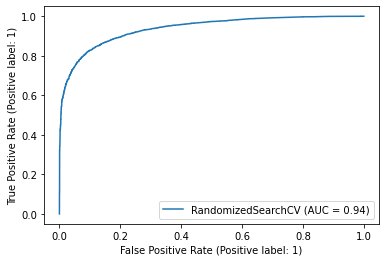

In [164]:
plot_roc_curve(selected_model, X_val, y_val)
prob_val_est =  selected_model.predict_proba(X_val)
roc_val = roc_auc_score(y_val, prob_val_est[:,1])
roc_val

In [166]:
Xt_val_df['condition_est'] = y_val_est
Xt_val_df['probability_est'] = prob_val_est[:,1]

def condition_est_f(x):
    output = 'used'
    if x==1:
        output = 'new'
        
    return output
        

Xt_val_df['condition_est'] = Xt_val_df['condition_est'].apply(lambda x: condition_est_f(x))
Xt_val_df['condition_est'] = Xt_val_df['condition_est'].astype(str)

Xt_val_df.value_counts(['condition_est'])
Xt_val_df

,warranty,sub_status,condition,deal_ids,base_price,non_mercado_pago_payment_methods,seller_id,variations,site_id,listing_type_id,...,shipping.local_pick_up,shipping.methods,shipping.tags,shipping.free_shipping,shipping.mode,shipping.dimensions,shipping.free_methods,target,condition_est,probability_est
0,None,[],used,[],6700.0,"[{'description': 'Transferencia bancaria', 'id...",6469674142,[],MLA,silver,...,True,[],[],False,custom,None,NaN,0,new,0.866105
1,Sí,[],new,[],119.0,[],5921388606,[],MLA,bronze,...,False,[],[],False,not_specified,None,NaN,1,new,0.993948
2,Sí,[],new,[],450.0,[],5675694703,[],MLA,bronze,...,False,[],[],False,me2,None,NaN,1,new,0.905767
3,Sí,[],used,[],40.0,"[{'description': 'Transferencia bancaria', 'id...",8566233865,[],MLA,bronze,...,True,[],[],False,me2,None,NaN,0,used,0.080018
4,None,[],new,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",9453231792,[],MLA,bronze,...,True,[],[],False,not_specified,None,NaN,1,new,0.747787
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,None,[],used,[],30.0,"[{'description': 'Transferencia bancaria', 'id...",1455091083,[],MLA,free,...,True,[],[],False,me2,None,NaN,0,used,0.001400
9996,None,[],new,[],239.0,"[{'description': 'Tarjeta de crédito', 'id': '...",2483727970,[],MLA,bronze,...,False,[],[],False,not_specified,None,NaN,1,new,0.987441
9997,None,[],used,[],600.0,[],7300544890,[{'attribute_combinations': [{'value_id': '920...,MLA,bronze,...,False,[],[],False,me2,None,NaN,0,new,0.722671
9998,"Buen estado, se verifica al entregar. la total...",[],used,[],50.0,"[{'description': 'Transferencia bancaria', 'id...",6600908485,[],MLA,bronze,...,True,[],[],False,me2,None,NaN,0,used,0.085832


In [167]:
Xt_val_df.to_excel(OUTPUT_DIR + 'usados_estimation.xlsx', index=False)
Xt_val_df.shape

(10000, 59)